In [1]:
# core imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# remove the limit from the number of displayed columns and rows so that we can see entire frame
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 200)

Exploratory Data Analytics

In [2]:
df = pd.read_csv("used_device_data.csv")
print(f"Total {df.shape[0]} rows and {df.shape[1]} columns")
np.random.seed(1) # get same random results every time
df.sample(n=20)

Total 3454 rows and 15 columns


,device_brand,os,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
866,Others,Android,15.24,no,no,8.00,2.0,16.0,4.00,3000.0,206.0,2014,632,4.038832,5.190788
957,Celkon,Android,10.16,no,no,3.15,0.3,512.0,0.25,1400.0,140.0,2013,637,2.800325,3.884652
280,Infinix,Android,15.39,yes,no,NaN,8.0,32.0,2.00,5000.0,185.0,2020,329,4.370713,4.487287
2150,Oppo,Android,12.83,yes,no,13.00,16.0,64.0,4.00,3200.0,148.0,2017,648,4.677863,5.639422
93,LG,Android,15.29,yes,no,13.00,5.0,32.0,3.00,3500.0,179.0,2019,216,4.517650,5.300415
1040,Gionee,Android,12.83,yes,no,13.00,8.0,32.0,4.00,3150.0,166.0,2016,970,4.645640,5.634325
3170,ZTE,Others,10.16,no,no,3.15,5.0,16.0,4.00,1400.0,125.0,2014,1007,3.764451,4.244344
2742,Sony,Android,12.70,yes,no,20.70,2.0,16.0,4.00,3000.0,170.0,2013,1060,4.422809,5.799820
102,Meizu,Android,15.29,yes,no,NaN,20.0,128.0,6.00,3600.0,165.0,2019,332,4.959412,6.040659
1195,HTC,Android,10.29,no,no,8.00,2.0,32.0,4.00,2000.0,146.0,2015,892,4.227855,4.879007


In [3]:
df.info()
df.describe() # describe all variables
df.describe(include="object") # describe only object variables


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3454 entries, 0 to 3453
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   device_brand           3454 non-null   object 
 1   os                     3454 non-null   object 
 2   screen_size            3454 non-null   float64
 3   4g                     3454 non-null   object 
 4   5g                     3454 non-null   object 
 5   rear_camera_mp         3275 non-null   float64
 6   front_camera_mp        3452 non-null   float64
 7   internal_memory        3450 non-null   float64
 8   ram                    3450 non-null   float64
 9   battery                3448 non-null   float64
 10  weight                 3447 non-null   float64
 11  release_year           3454 non-null   int64  
 12  days_used              3454 non-null   int64  
 13  normalized_used_price  3454 non-null   float64
 14  normalized_new_price   3454 non-null   float64
dtypes: f

,device_brand,os,4g,5g
count,3454,3454,3454,3454
unique,34,4,2,2
top,Others,Android,yes,no
freq,502,3214,2335,3302


device_brand,os,4g and 5g are objects.All rest variables are numeric.

In [4]:
duplicated_rows = df[df.duplicated()]
duplicated_rows.shape

(0, 15)

There is no duplicated rows in our dataset

4g and 5g only has Yes and No values, we can replace them with numeric 0 and 1

In [5]:
df["4g"] = df["4g"].replace(["yes","no"], [1, 0])
df["5g"] = df["5g"].replace(["yes","no"], [1, 0])

Let explore other object variables

Check for unique values in each column

In [6]:
df.nunique()

device_brand               34
os                          4
screen_size               142
4g                          2
5g                          2
rear_camera_mp             41
front_camera_mp            37
internal_memory            15
ram                        12
battery                   324
weight                    555
release_year                8
days_used                 924
normalized_used_price    3094
normalized_new_price     2988
dtype: int64

Check for null values in dataset. If we remove rows with null values we will have fewer rows and prediction will be worst

In [7]:
df.isnull().sum()

device_brand               0
os                         0
screen_size                0
4g                         0
5g                         0
rear_camera_mp           179
front_camera_mp            2
internal_memory            4
ram                        4
battery                    6
weight                     7
release_year               0
days_used                  0
normalized_used_price      0
normalized_new_price       0
dtype: int64

Unfortunately we have null values in our dataset.Let see if we have outliers in our dataset to determinate how to replace null values(median or mean). Removing those won't be a correct option as we have less rows.

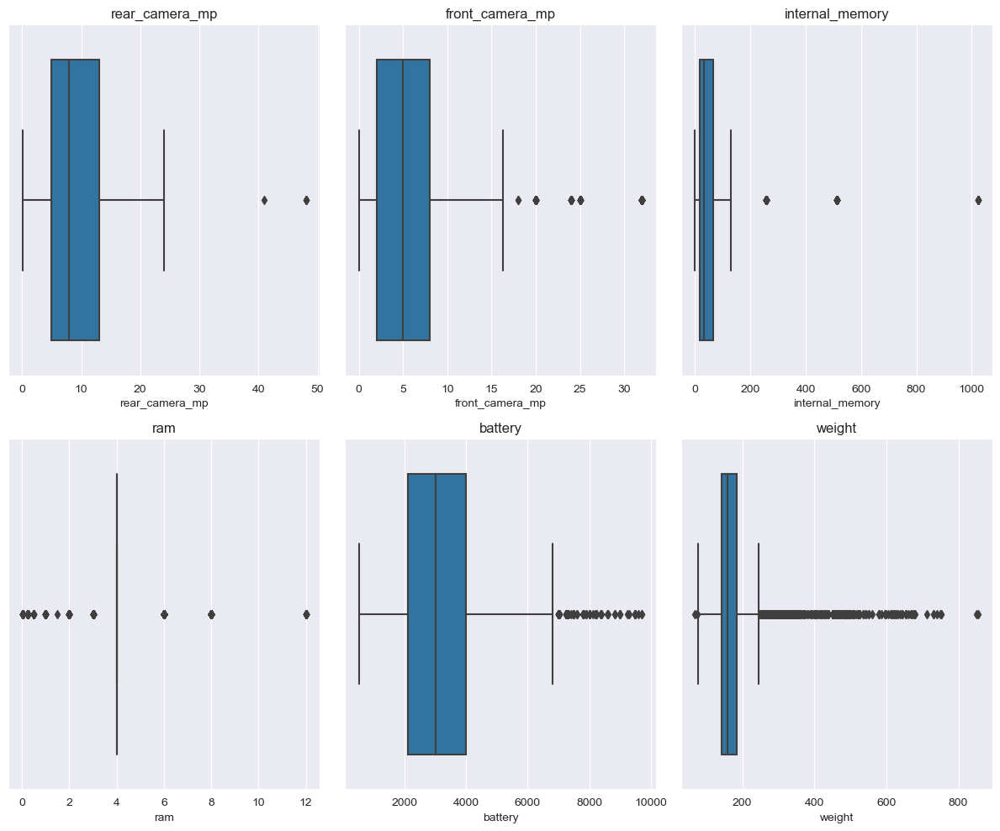

In [8]:
null_columns=['rear_camera_mp','front_camera_mp','internal_memory','ram','battery','weight']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 10))
axes = axes.flatten()
for i, col in enumerate(null_columns):
    sns.boxplot(x=df[col], ax=axes[i])
    axes[i].set_title(col)
plt.tight_layout()
plt.show()

We have outliers in our dataset.Best practise is when we have outliers to replace null values with median because mean is heavily influenced by outliers, and can give an inaccurate estimate.Median is in the other hand is more robust and less sensitive to outliers than mean.We will replace null vales for each feature grouped by respective device brand with its median to be more precise.

In [9]:
for i in null_columns:
    median = df.groupby(["device_brand"], as_index=False)[i].median()
    print(f'{i} median value for each brand: {median}')
    print("****************************")
    df[i] = df.groupby(["device_brand"], as_index=False)[i].transform(
        lambda x: x.fillna(x.median())
    )

rear_camera_mp median value for each brand:    device_brand  rear_camera_mp
0          Acer            5.00
1       Alcatel            5.00
2         Apple           12.00
3          Asus           13.00
4    BlackBerry            8.00
5        Celkon            3.15
6       Coolpad           13.00
7        Gionee            8.00
8        Google           12.20
9           HTC           13.00
10        Honor           13.00
11       Huawei           13.00
12      Infinix             NaN
13      Karbonn            5.00
14           LG            8.00
15         Lava            8.00
16       Lenovo            8.00
17        Meizu           13.00
18     Micromax            5.00
19    Microsoft            8.00
20     Motorola           13.00
21        Nokia            5.00
22      OnePlus           13.00
23         Oppo           13.00
24       Others            8.00
25    Panasonic            8.00
26       Realme           13.00
27      Samsung            8.00
28         Sony           13

In [10]:
df.isnull().sum()
rear_median = df["rear_camera_mp"].median()
df["rear_camera_mp"] = df["rear_camera_mp"].fillna(rear_median)

Not every device brand has defined value for rear camera, so we will replace rear camera nan values with generic median.

In [11]:
df.isnull().sum()

device_brand             0
os                       0
screen_size              0
4g                       0
5g                       0
rear_camera_mp           0
front_camera_mp          0
internal_memory          0
ram                      0
battery                  0
weight                   0
release_year             0
days_used                0
normalized_used_price    0
normalized_new_price     0
dtype: int64

In [12]:
num_features = [
    'screen_size',
     'rear_camera_mp',
     'front_camera_mp',
     'battery',
     'weight',
     'days_used',
     'ram',
     'internal_memory',
     'normalized_new_price',
     'normalized_used_price',
     'release_year']

Data Visualization

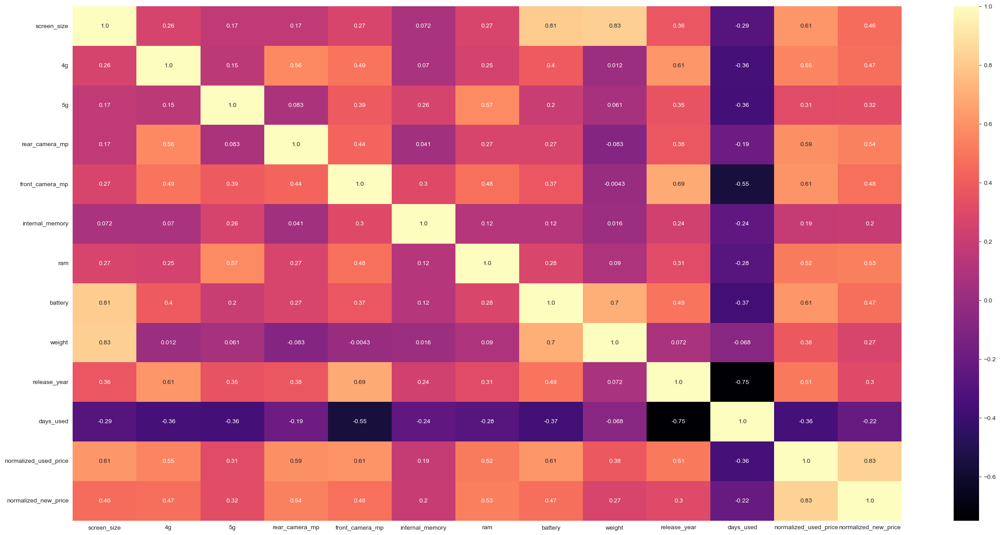

In [13]:
plt.figure(figsize=(30,15))
sns.heatmap(df.corr(), annot=True, fmt=".2", cmap="magma")
plt.show()

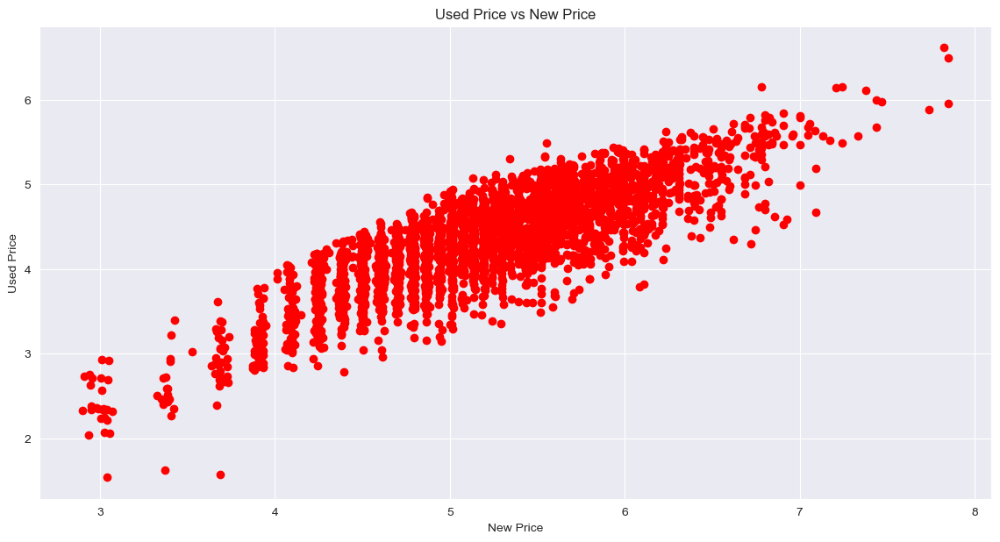

In [14]:
plt.figure(figsize=(14,7))
plt.scatter(df.normalized_new_price, df.normalized_used_price, color="red")
plt.title("Used Price vs New Price")
plt.xlabel("New Price")
plt.ylabel("Used Price")
plt.grid(visible= True)
plt.show()

We see very good linear relationship between new and used price.When the price of the new phone is increasing, the price of the used phone is also increasing.

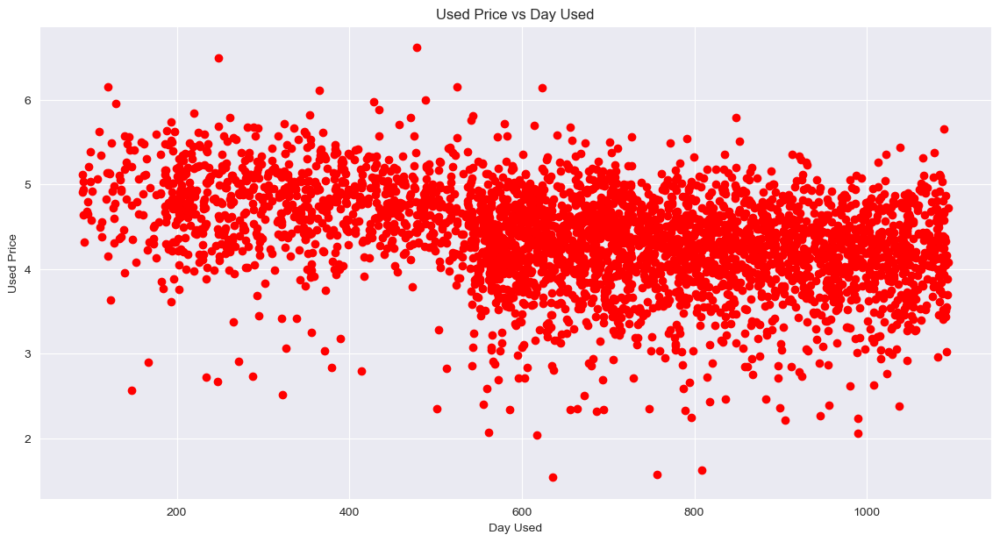

In [15]:
plt.figure(figsize=(14,7))
plt.scatter(df.days_used, df.normalized_used_price, color="red")
plt.title("Used Price vs Day Used")
plt.xlabel("Day Used")
plt.ylabel("Used Price")
plt.grid(visible= True)
plt.show()

Not good linear relationship between these two.

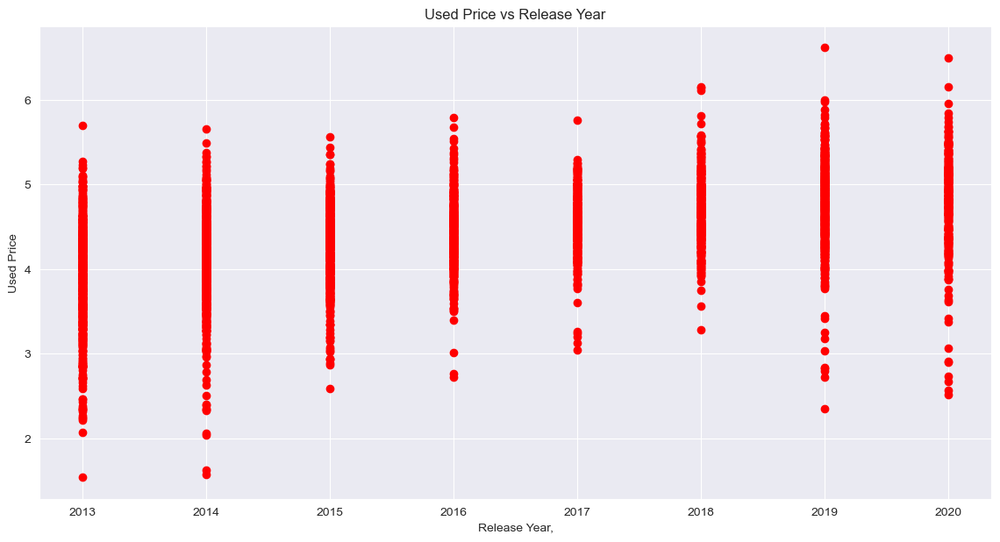

In [16]:
plt.figure(figsize=(14,7))
plt.scatter(df.release_year, df.normalized_used_price, color="red")
plt.title("Used Price vs Release Year")
plt.xlabel("Release Year,")
plt.ylabel("Used Price")
plt.grid(visible= True)
plt.show()

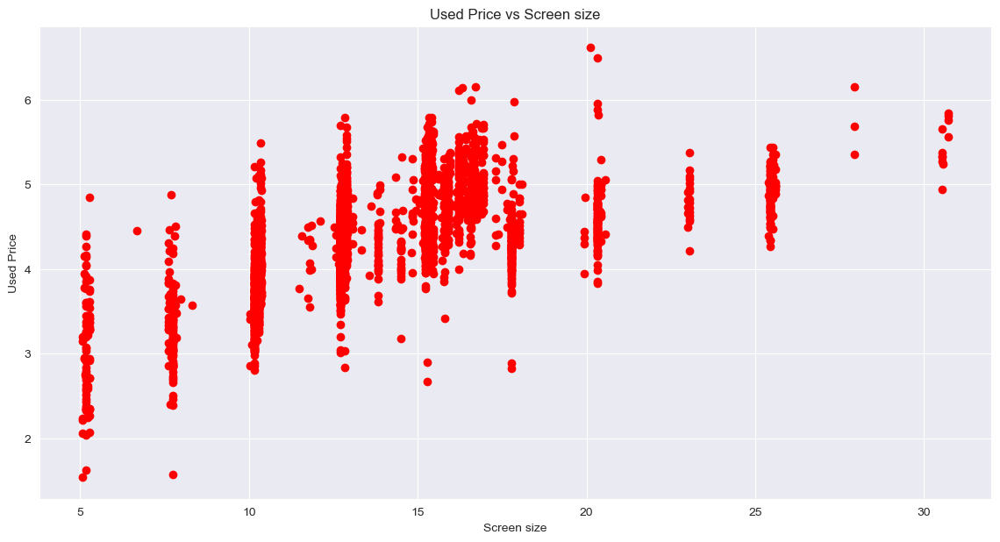

In [17]:
plt.figure(figsize=(14,7))
plt.scatter(df.screen_size, df.normalized_used_price, color="red")
plt.title("Used Price vs Screen size")
plt.xlabel("Screen size")
plt.ylabel("Used Price")
plt.grid(visible= True)
plt.show()

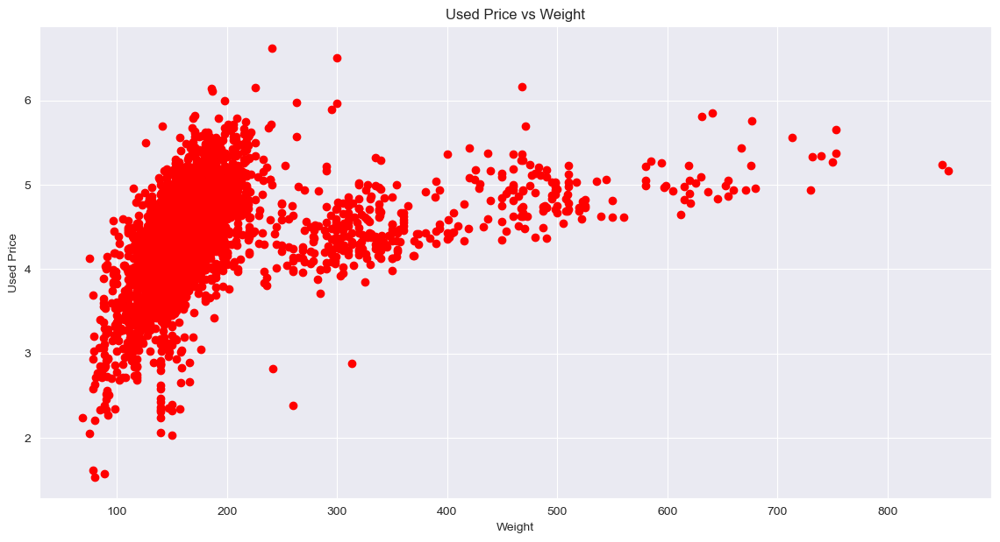

In [18]:
plt.figure(figsize=(14,7))
plt.scatter(df.weight, df.normalized_used_price, color="red")
plt.title("Used Price vs Weight")
plt.xlabel("Weight")
plt.ylabel("Used Price")
plt.grid(visible= True)
plt.show()

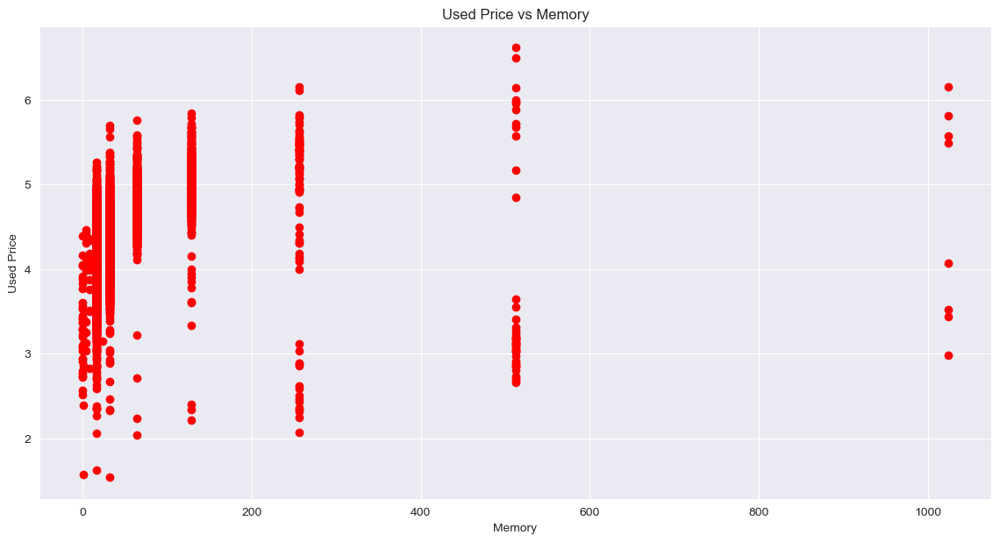

In [19]:
plt.show()
plt.figure(figsize=(14, 7))
plt.scatter(df.internal_memory, df.normalized_used_price, color="red")
plt.title("Used Price vs Memory")
plt.xlabel("Memory")
plt.ylabel("Used Price")
plt.grid(visible=True)
plt.show()

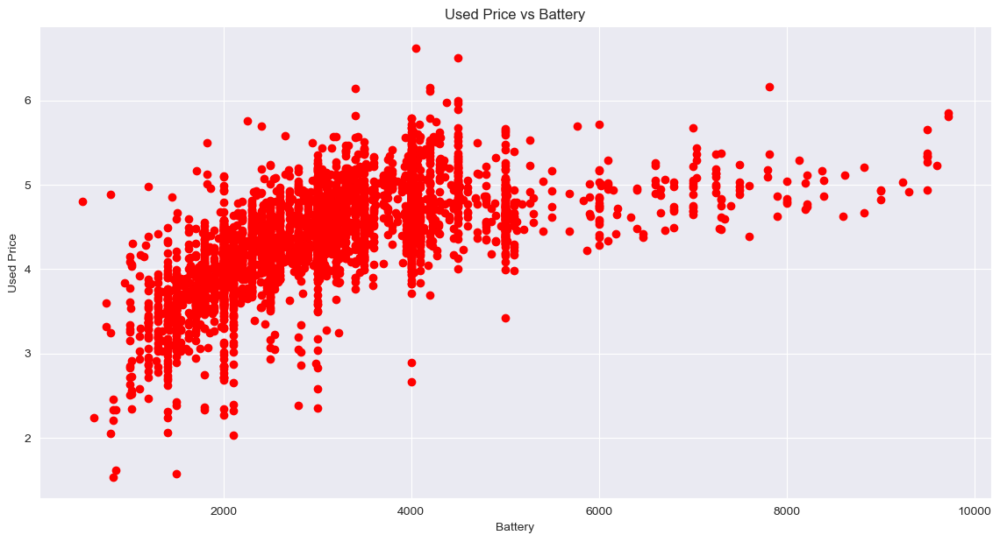

In [20]:
plt.show()
plt.figure(figsize=(14, 7))
plt.scatter(df.battery, df.normalized_used_price, color="red")
plt.title("Used Price vs Battery")
plt.xlabel("Battery")
plt.ylabel("Used Price")
plt.grid(visible=True)
plt.show()

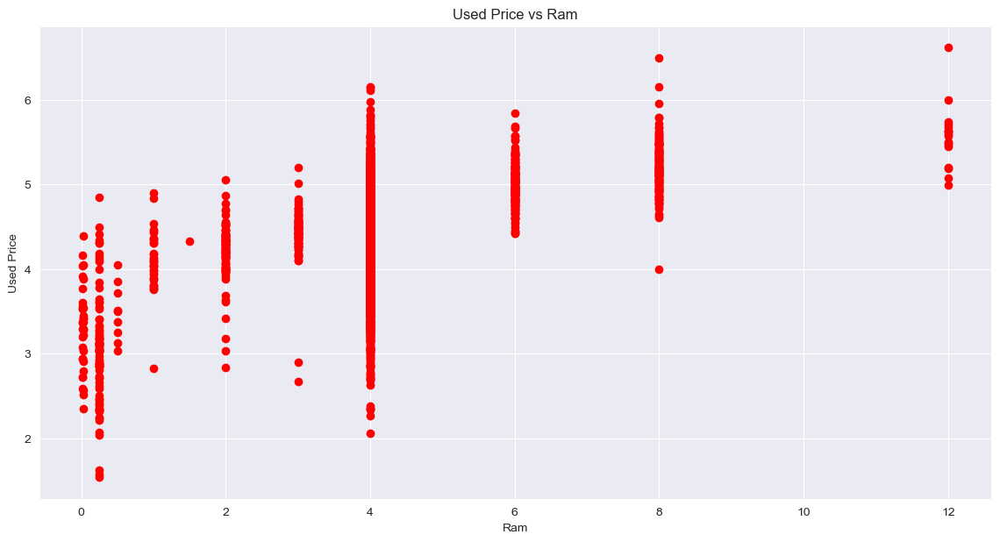

In [21]:
plt.show()
plt.figure(figsize=(14, 7))
plt.scatter(df.ram, df.normalized_used_price, color="red")
plt.title("Used Price vs Ram")
plt.xlabel("Ram")
plt.ylabel("Used Price")
plt.grid(visible=True)
plt.show()

We can see good linear relationship when ram is 4 gb.

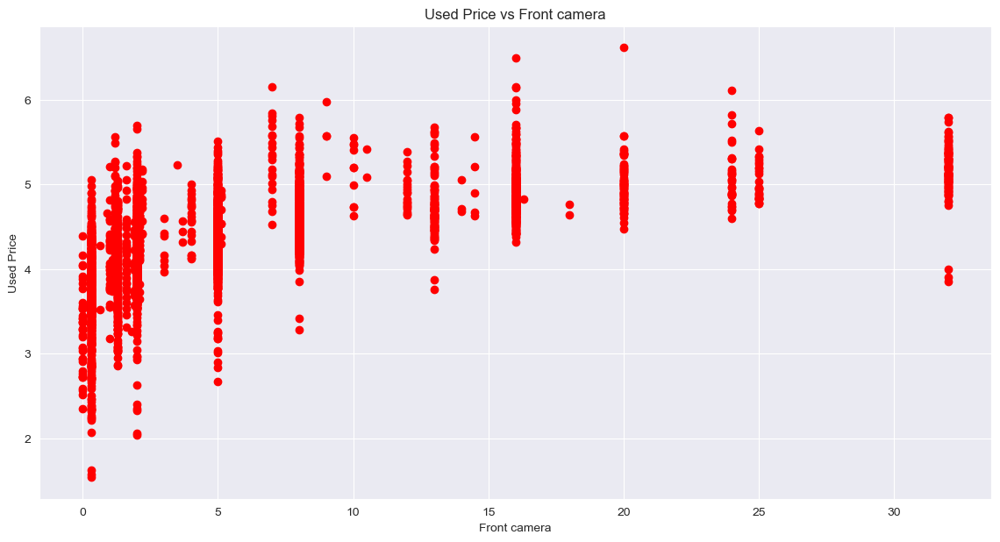

In [22]:
plt.show()
plt.figure(figsize=(14, 7))
plt.scatter(df.front_camera_mp, df.normalized_used_price, color="red")
plt.title("Used Price vs Front camera")
plt.xlabel("Front camera")
plt.ylabel("Used Price")
plt.grid(visible=True)
plt.show()

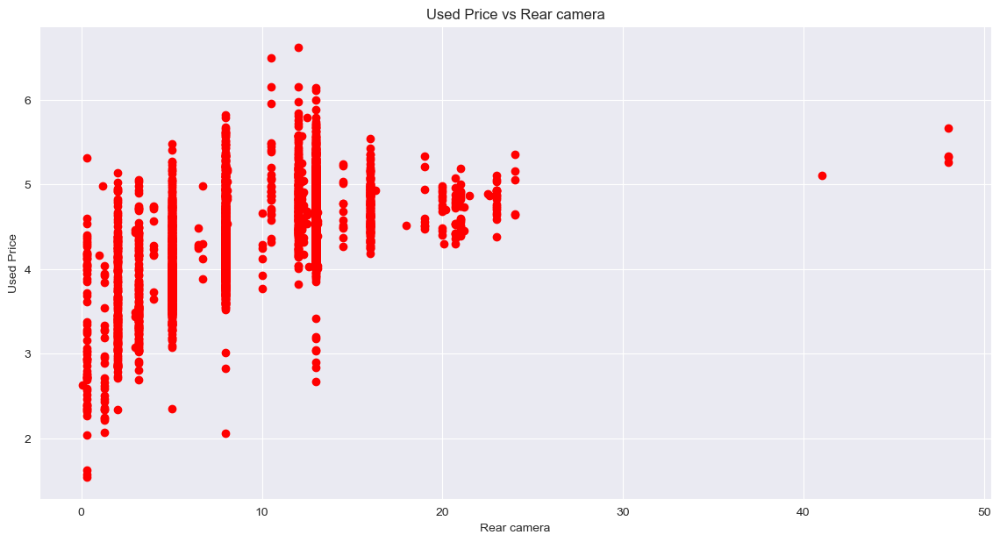

In [23]:
plt.show()
plt.figure(figsize=(14, 7))
plt.scatter(df.rear_camera_mp, df.normalized_used_price, color="red")
plt.title("Used Price vs Rear camera")
plt.xlabel("Rear camera")
plt.ylabel("Used Price")
plt.grid(visible=True)
plt.show()

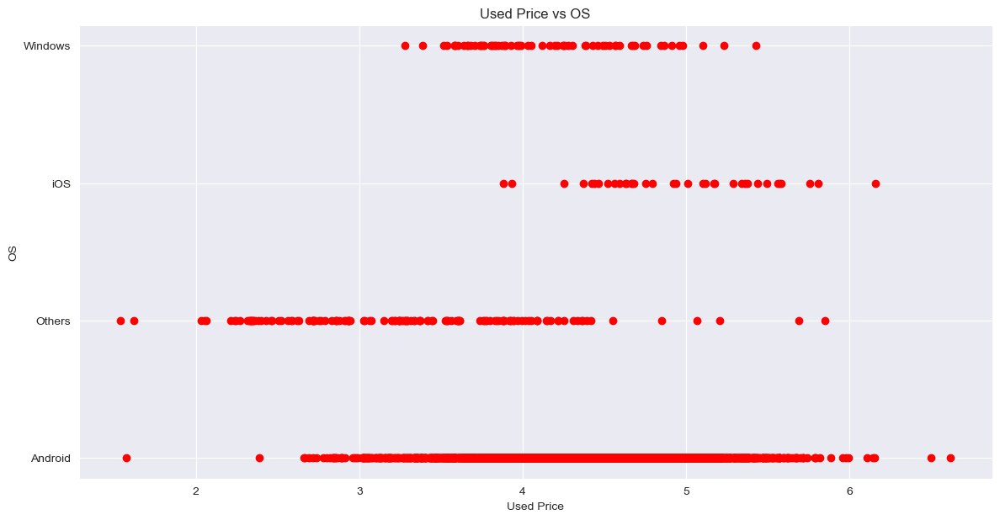

In [24]:
plt.show()
plt.figure(figsize=(14, 7))
plt.scatter(df.normalized_used_price, df.os, color="red")
plt.title("Used Price vs OS")
plt.ylabel("OS")
plt.xlabel("Used Price")
plt.grid(visible=True)
plt.show()

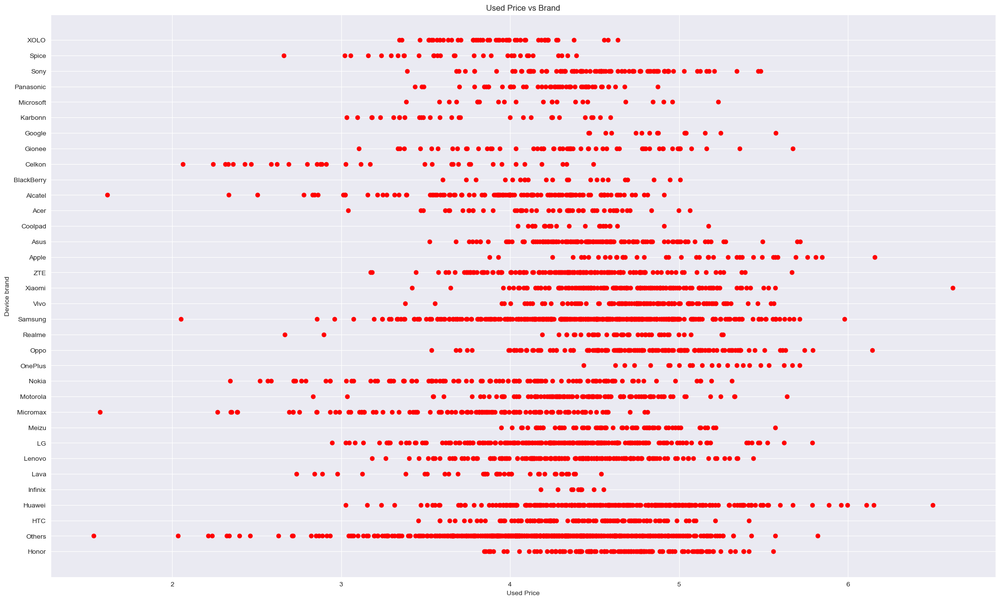

In [25]:
plt.show()
plt.show()
plt.figure(figsize=(25, 15))
plt.scatter(df.normalized_used_price, df.device_brand, color="red")
plt.title("Used Price vs Brand")
plt.ylabel("Device brand")
plt.xlabel("Used Price")
plt.grid(visible=True)
plt.show()

<AxesSubplot:xlabel='normalized_used_price', ylabel='device_brand'>

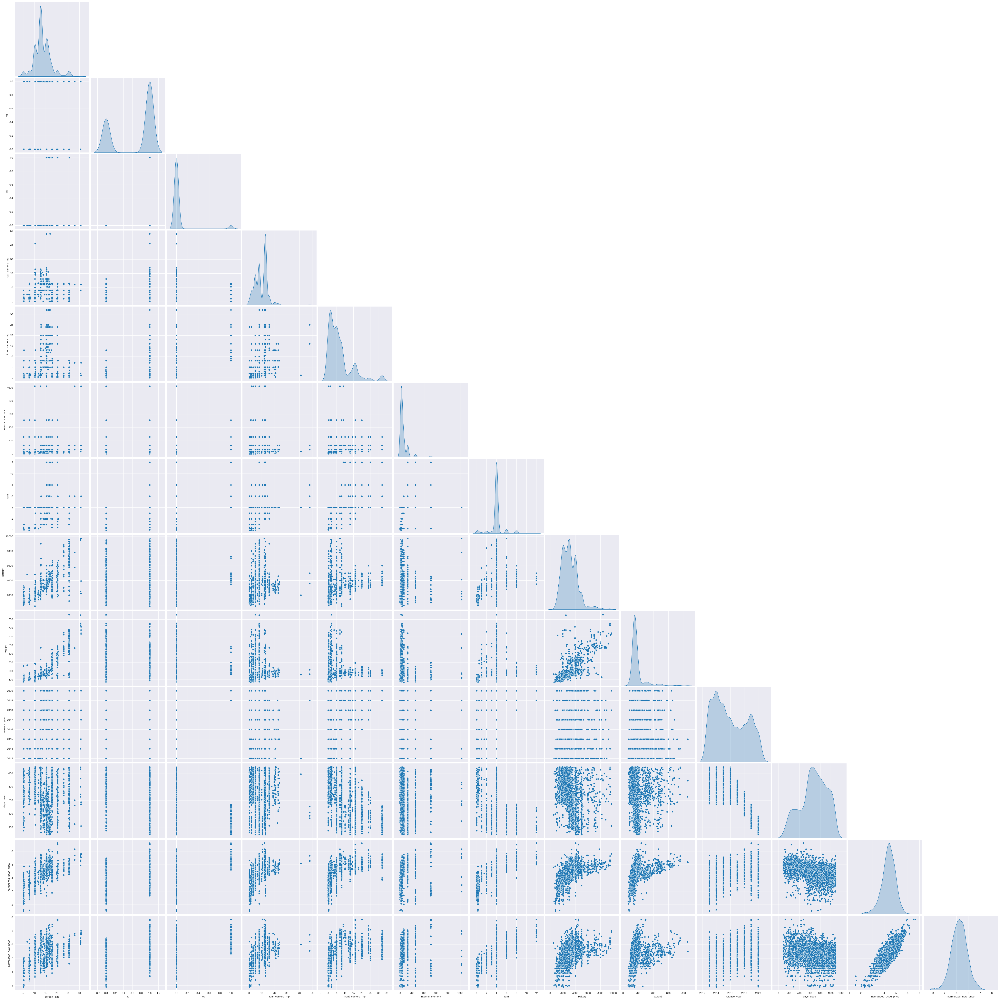

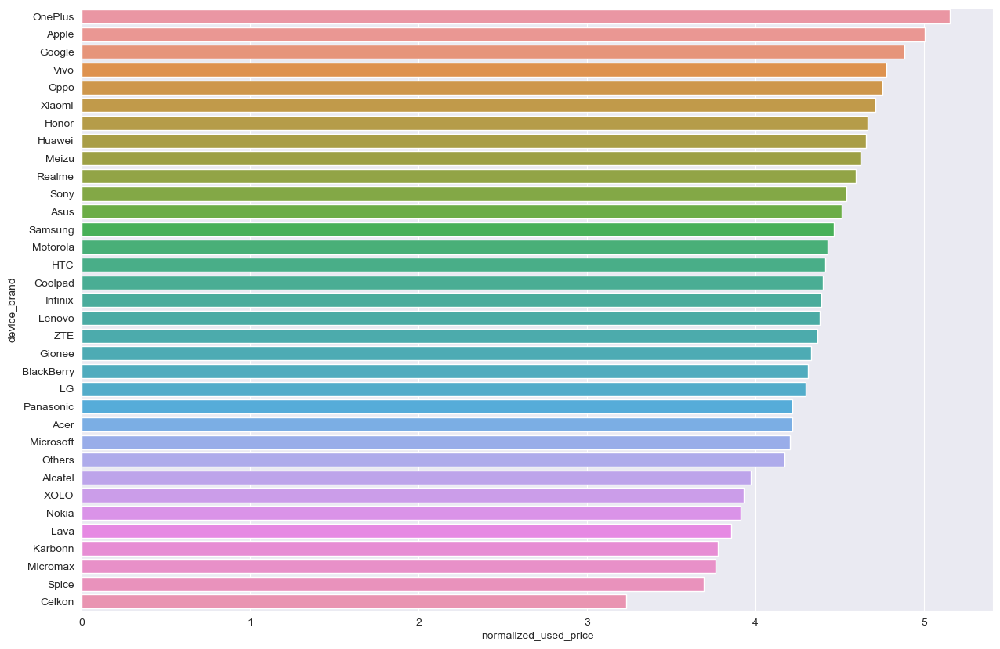

In [26]:
sns.pairplot(df, height=4,diag_kind="kde", corner=True)
plt.figure(figsize=(15,10))
sns.barplot(
    x=df.normalized_used_price,
    y=df.device_brand,
    ci=False,
    order=df.groupby("device_brand")
    .mean()["normalized_used_price"]
    .sort_values(ascending=False)
    .index
)

Highest average price has onePlus followed by Apple.Spike and Celkon have the lowest average price.

<AxesSubplot:xlabel='normalized_used_price', ylabel='os'>

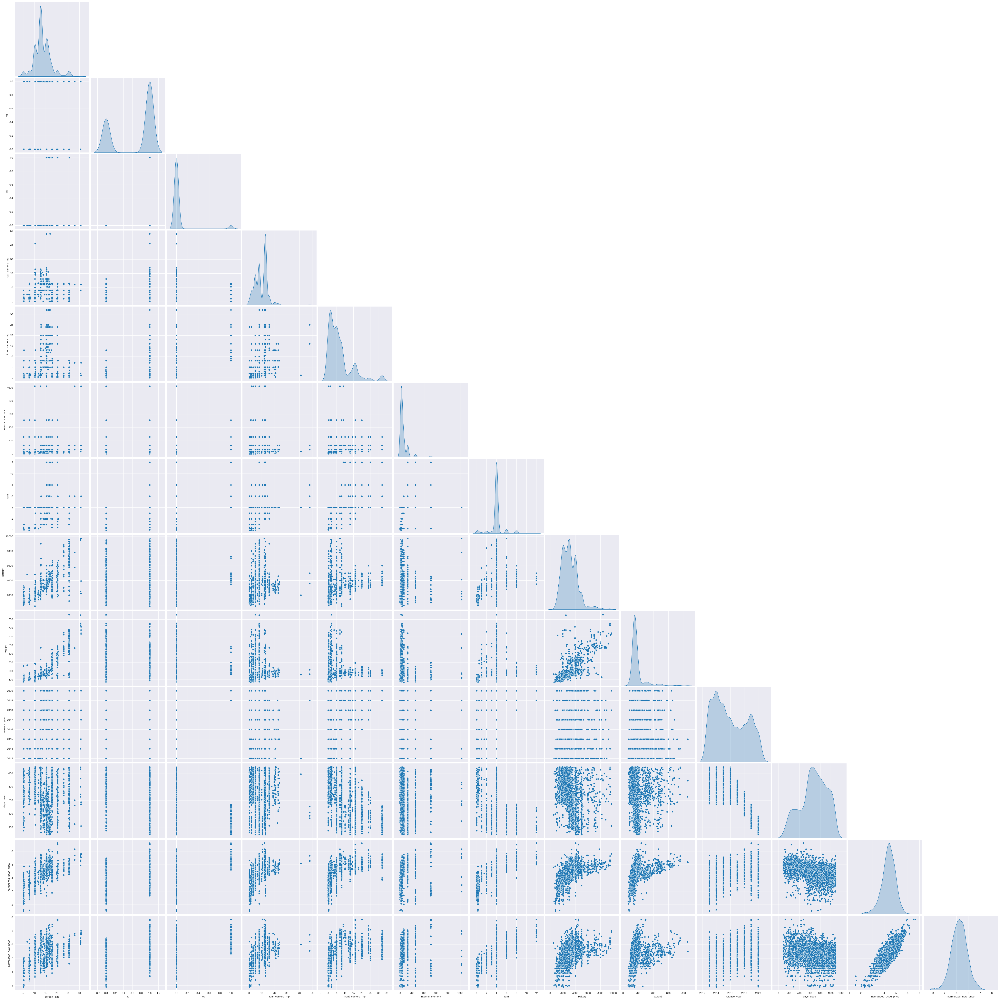

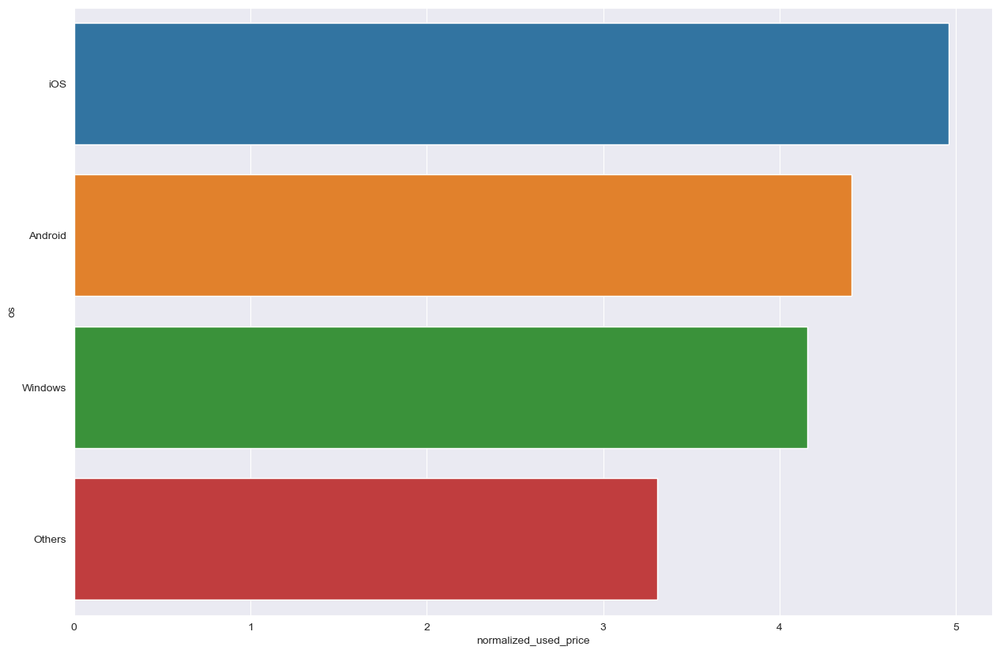

In [27]:
sns.pairplot(df, height=4,diag_kind="kde", corner=True)
plt.figure(figsize=(15,10))
sns.barplot(
    x=df.normalized_used_price,
    y=df.os,
    ci=False,
    order=df.groupby("os")
    .mean()["normalized_used_price"]
    .sort_values(ascending=False)
    .index
)

<AxesSubplot:xlabel='4g', ylabel='normalized_used_price'>

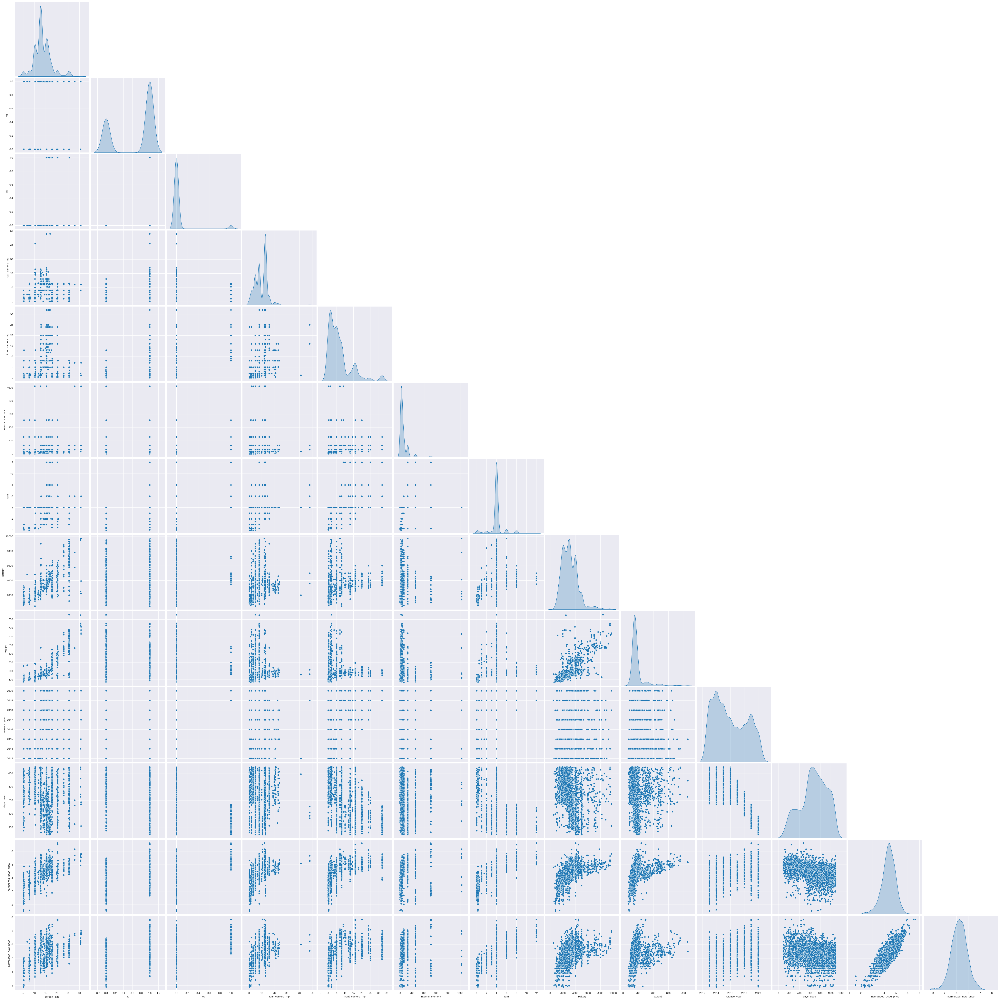

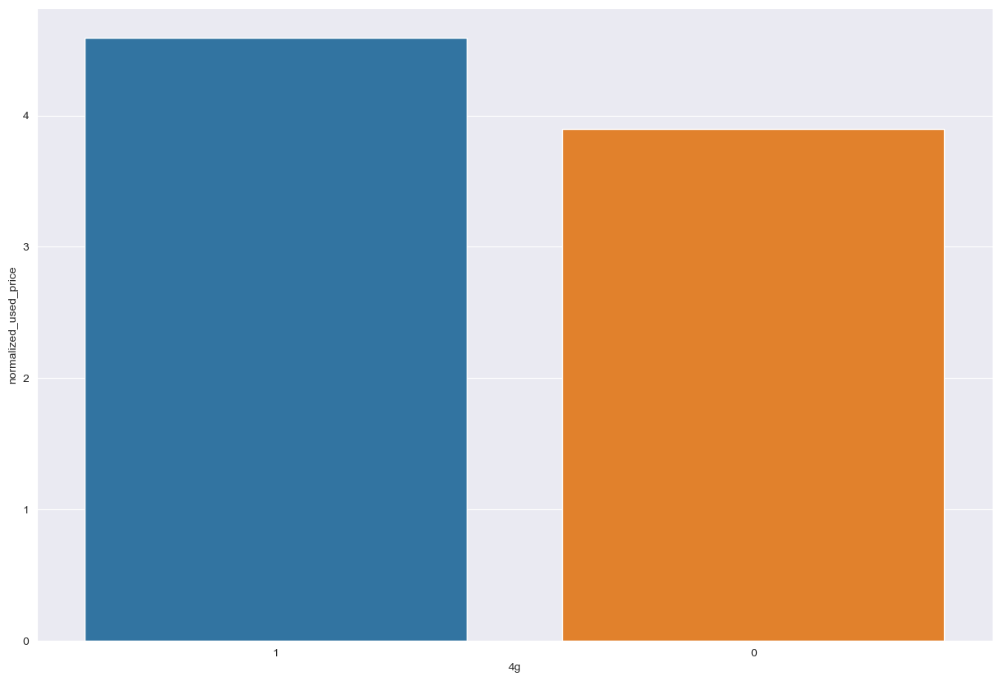

In [28]:
sns.pairplot(df, height=4,diag_kind="kde", corner=True)
plt.figure(figsize=(15,10))
sns.barplot(
    x=df["4g"],
    y=df.normalized_used_price,
    ci=False,
    order=df.groupby("4g")
    .mean()["normalized_used_price"]
    .sort_values(ascending=False)
    .index
)

<AxesSubplot:xlabel='5g', ylabel='normalized_used_price'>

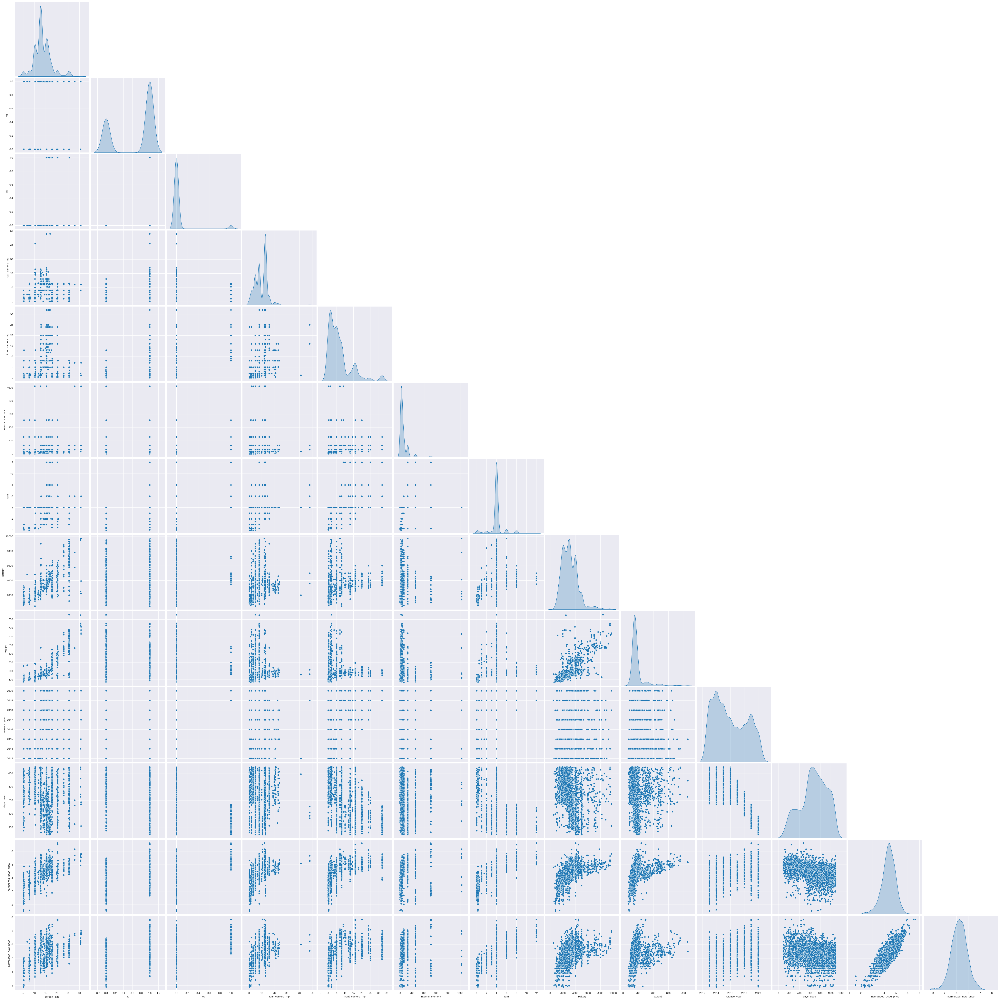

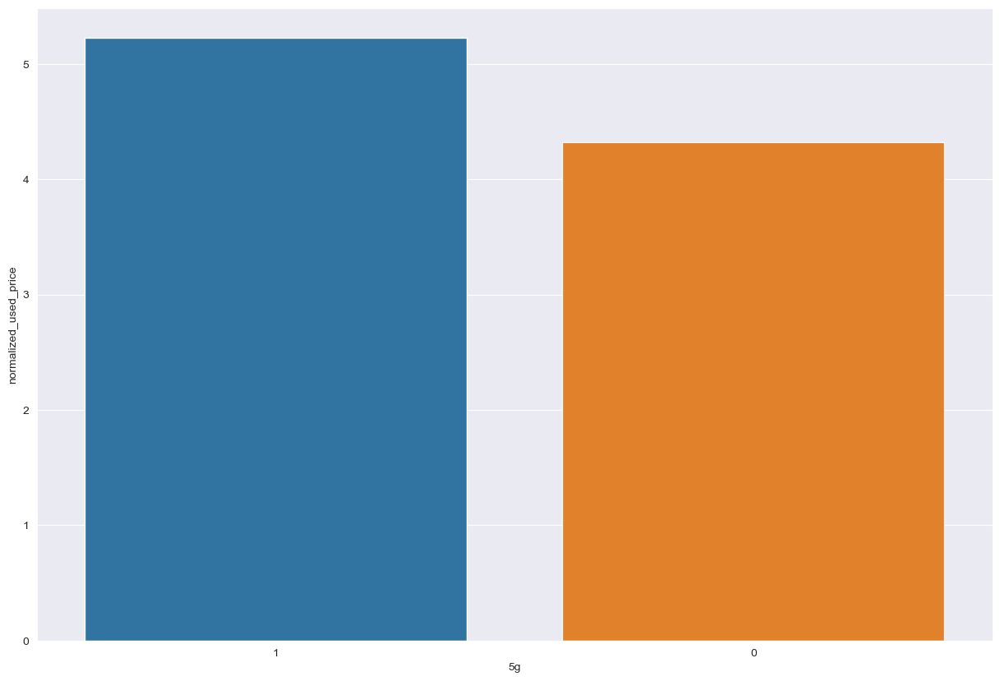

In [29]:
sns.pairplot(df, height=4,diag_kind="kde", corner=True)
plt.figure(figsize=(15,10))
sns.barplot(
    x=df["5g"],
    y=df.normalized_used_price,
    ci=False,
    order=df.groupby("5g")
    .mean()["normalized_used_price"]
    .sort_values(ascending=False)
    .index
)

<AxesSubplot:xlabel='device_brand'>

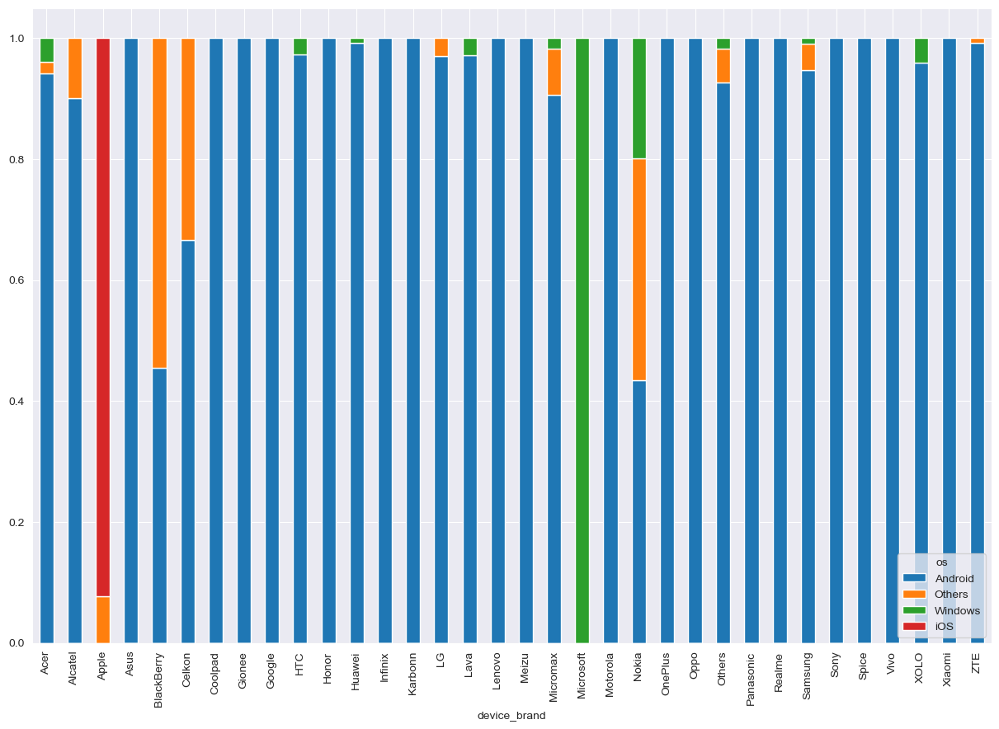

In [30]:
pd.crosstab(df.device_brand,df.os, normalize="index").plot(
    kind= "bar",
    stacked= True,
    figsize= (15,10)
)

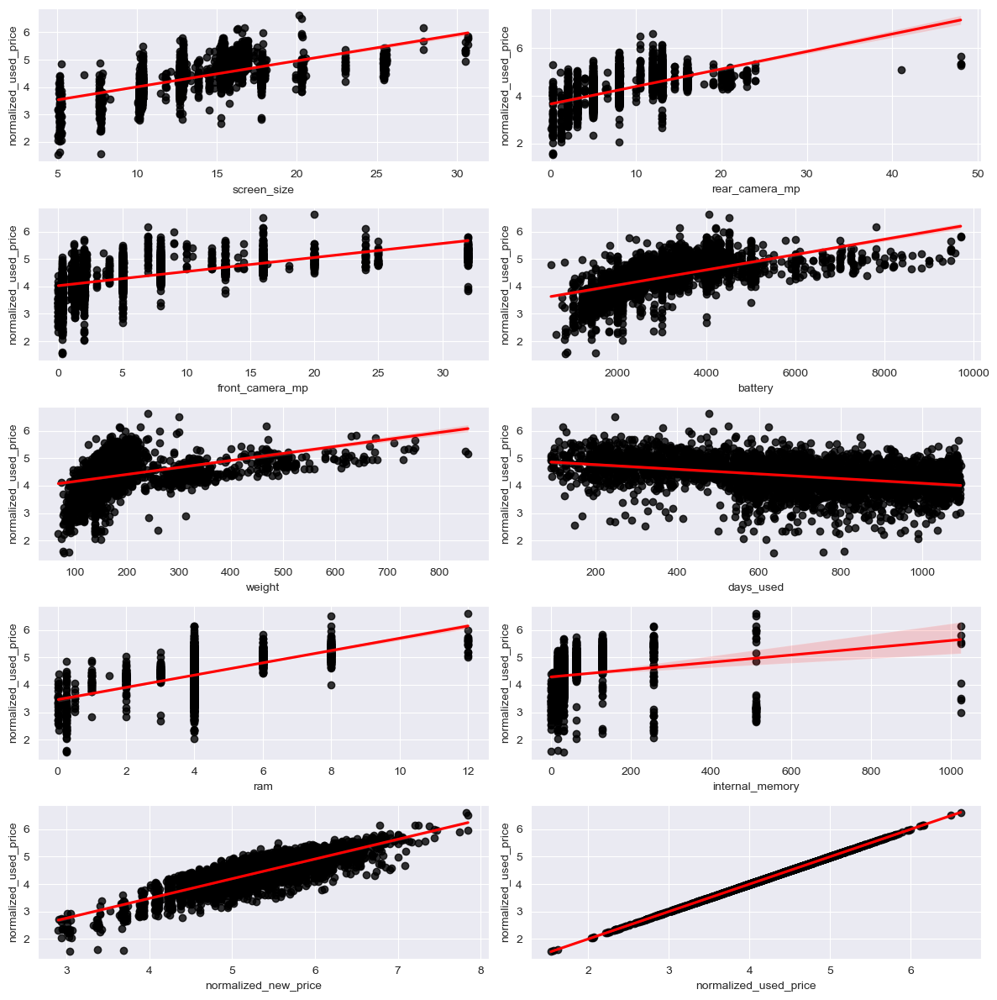

In [31]:
fig,axs= plt.subplots(5,2,figsize=(12,12))
axs=axs.ravel()
for i,ax in enumerate(axs):
    sns.regplot(x=num_features[i],y='normalized_used_price',data=df,ax=ax,color='red',scatter_kws={"color":"black"})
plt.tight_layout()
plt.show()

Days used has negative/falling regression line
All other numerical features has rising/positive regression line

Distribution and outliers

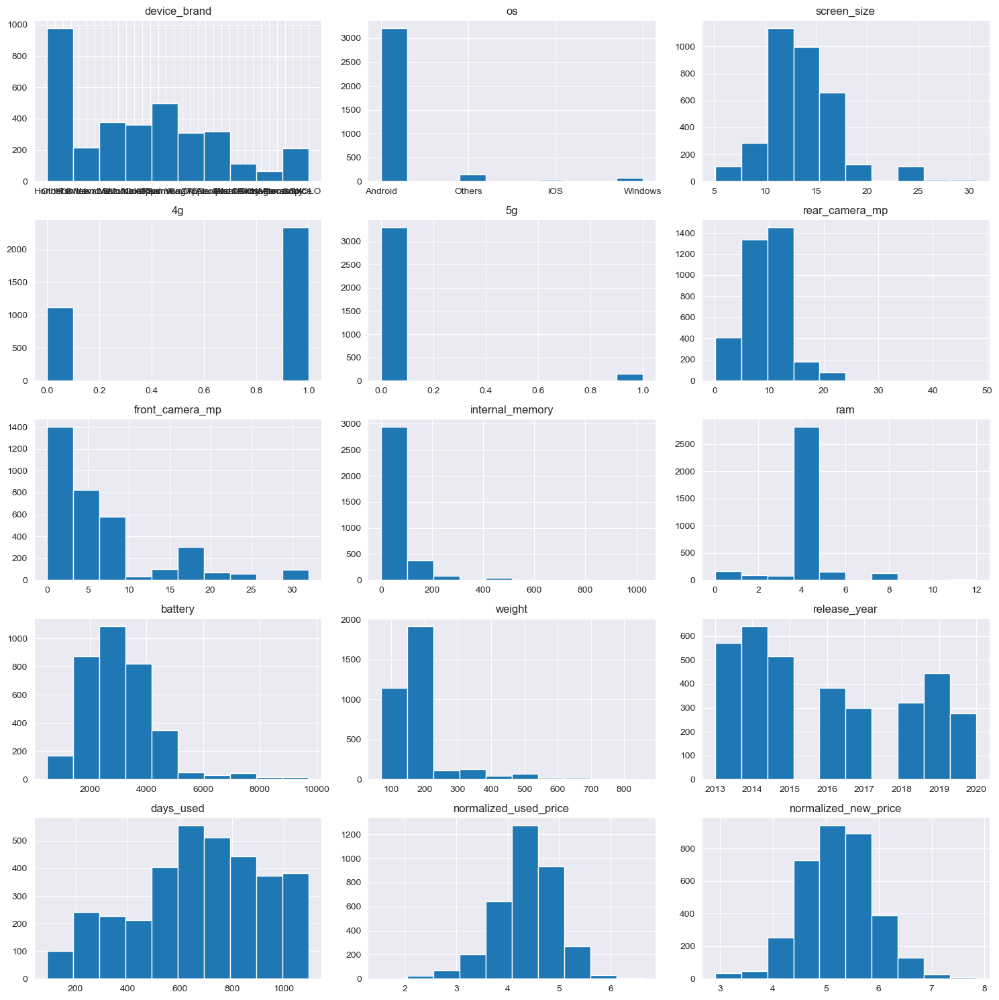

In [32]:
fig,axs= plt.subplots(5,3,figsize=(15, 15))
axs = axs.ravel()
for i, feature in enumerate(df.columns):
    axs[i].hist(df[feature])
    axs[i].set_title(feature)
plt.tight_layout()
plt.show()

Numeric values

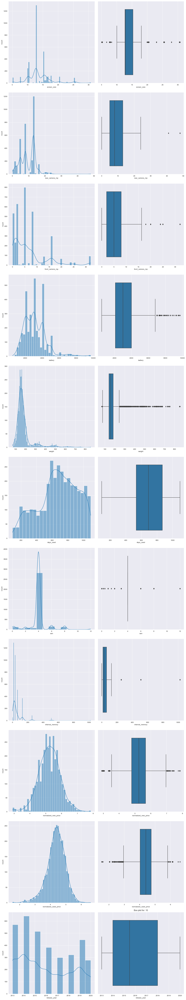

In [33]:
fig, axs = plt.subplots(nrows=11, ncols=2, figsize=(15, 80))
for i, feature in enumerate(num_features):
    plt.title(f'Histogram for: {i}')
    sns.histplot(x=df[feature], ax=axs[i,0],kde = True)
    plt.title(f'Box plot for: {i}')
    sns.boxplot(x=df[feature], ax=axs[i,1])
plt.tight_layout()
plt.show()

Only normalized_new_price and normalized_used_price have clear normal distribution(symmetric).All others have skewed distribution(not symmetric).

Calculate  interquartile range(IQR)  and q1 and q3.IQR represents the spread of the middle 50% of the data and is a measure of variability that is less sensitive to outliers than the range.

In [34]:
def remove_outlier(feature_data):
    sorted(feature_data)
    q1, q3 = np.quantile(feature_data, [0.25, 0.75])
    iqr = q3 - q1
    lower_q = q1 - 1.5 * iqr
    upper_q = q3 + 1.5 * iqr
    return lower_q, upper_q

In [35]:
for feature in num_features:
    col_data = df[feature].values
    lower,upper = remove_outlier(col_data)
    df[feature] = np.where(df[feature] > upper,upper,df[feature])
    df[feature] = np.where(df[feature] < lower,lower,df[feature])
    print(f'Feature: {feature}')
    print(f'Skewness value: {df[feature].skew()}')
    print('\n')


Feature: screen_size
Skewness value: 0.3318630500568397


Feature: rear_camera_mp
Skewness value: 0.054155689427748954


Feature: front_camera_mp
Skewness value: 0.9153559147746925


Feature: battery
Skewness value: 0.8439795503105297


Feature: weight
Skewness value: 0.6820491673032232


Feature: days_used
Skewness value: -0.34397722518149887


Feature: ram
Skewness value: 0


Feature: internal_memory
Skewness value: 1.3897059816252524


Feature: normalized_new_price
Skewness value: -0.023347397610323853


Feature: normalized_used_price
Skewness value: -0.28866971676493697


Feature: release_year
Skewness value: 0.32229665685465564




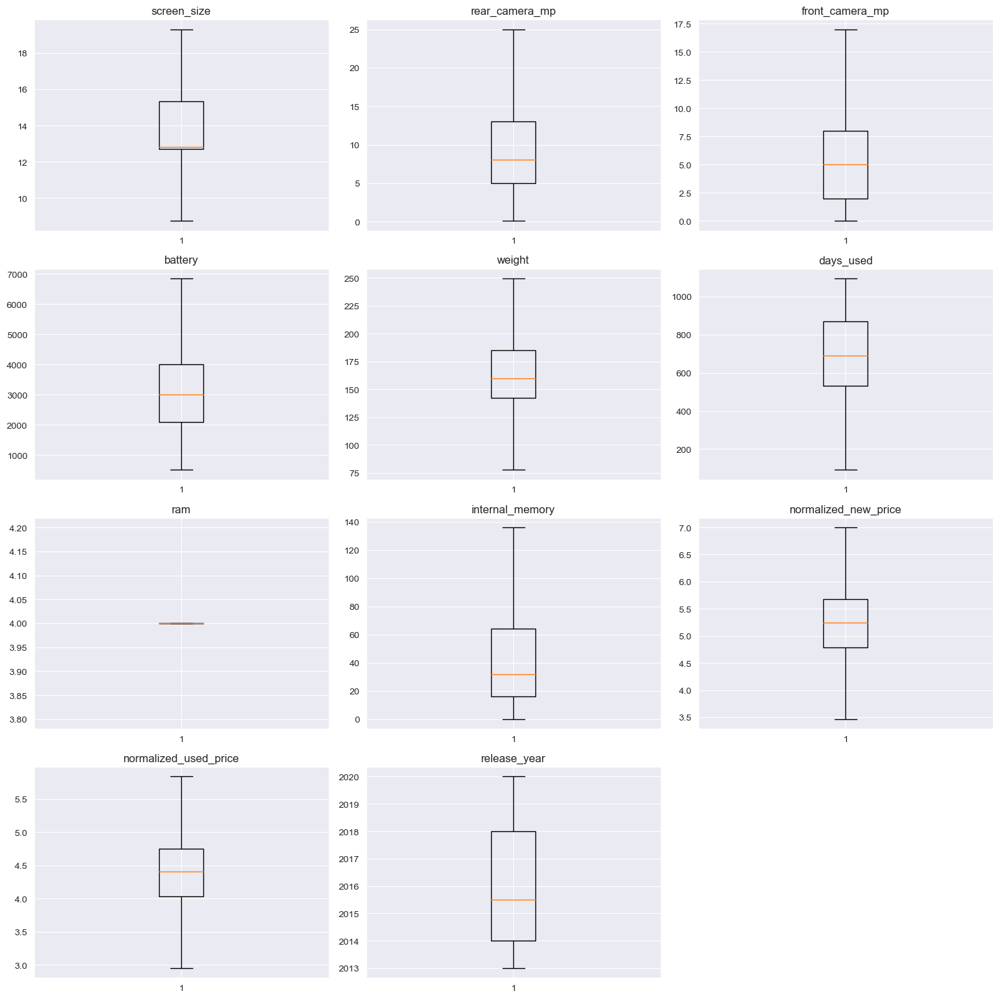

In [36]:
fig,axs= plt.subplots(4,3,figsize=(15, 15))
axs = axs.ravel()
for i, feature in enumerate(num_features):
    axs[i].boxplot(df[feature])
    axs[i].set_title(feature)
fig.delaxes(axs[-1])
plt.tight_layout()
plt.show()

Data preparation

In [37]:
X = df.drop("normalized_used_price", axis=1)
y = df[["normalized_used_price"]]
X.head()

,device_brand,os,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_new_price
0,Honor,Android,14.50,1,0,13.0,5.0,64.0,4.0,3020.0,146.0,2020.0,127.0,4.715100
1,Honor,Android,17.30,1,1,13.0,16.0,128.0,4.0,4300.0,213.0,2020.0,325.0,5.519018
2,Honor,Android,16.69,1,1,13.0,8.0,128.0,4.0,4200.0,213.0,2020.0,162.0,5.884631
3,Honor,Android,19.30,1,1,13.0,8.0,64.0,4.0,6850.0,249.5,2020.0,345.0,5.630961
4,Honor,Android,15.32,1,0,13.0,8.0,64.0,4.0,5000.0,185.0,2020.0,293.0,4.947837


In [38]:
X = pd.get_dummies(X, columns=["device_brand","os"], drop_first=True)
X.head()

,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_new_price,device_brand_Alcatel,device_brand_Apple,device_brand_Asus,device_brand_BlackBerry,device_brand_Celkon,device_brand_Coolpad,device_brand_Gionee,device_brand_Google,device_brand_HTC,device_brand_Honor,device_brand_Huawei,device_brand_Infinix,device_brand_Karbonn,device_brand_LG,device_brand_Lava,device_brand_Lenovo,device_brand_Meizu,device_brand_Micromax,device_brand_Microsoft,device_brand_Motorola,device_brand_Nokia,device_brand_OnePlus,device_brand_Oppo,device_brand_Others,device_brand_Panasonic,device_brand_Realme,device_brand_Samsung,device_brand_Sony,device_brand_Spice,device_brand_Vivo,device_brand_XOLO,device_brand_Xiaomi,device_brand_ZTE,os_Others,os_Windows,os_iOS
0,14.50,1,0,13.0,5.0,64.0,4.0,3020.0,146.0,2020.0,127.0,4.715100,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,17.30,1,1,13.0,16.0,128.0,4.0,4300.0,213.0,2020.0,325.0,5.519018,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,16.69,1,1,13.0,8.0,128.0,4.0,4200.0,213.0,2020.0,162.0,5.884631,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19.30,1,1,13.0,8.0,64.0,4.0,6850.0,249.5,2020.0,345.0,5.630961,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,15.32,1,0,13.0,8.0,64.0,4.0,5000.0,185.0,2020.0,293.0,4.947837,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [39]:
def split_x_y():
    X = df.drop("normalized_used_price", axis=1)
    y = df[["normalized_used_price"]]
    X = pd.get_dummies(X, columns=["device_brand","os"], drop_first=True)
    return X,y

We use one hot encoding to encode each not numerical(object) features so that we have all numerical values.We applied one hot encoding to device_brand and os.

Train and test data, evaluate

In [40]:
# imports
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.feature_selection import mutual_info_regression

Scaling and Normalization

In [41]:
def scale_standard(x):
    scaler = StandardScaler()
    scaler.fit(x)
    x_scaled = scaler.transform(x)
    return x_scaled

Standardization scales the values in our dataset to have a mean of 0 and a standard deviation of 1.

In [42]:
def scale_normalization(x):
    scaler = MinMaxScaler()
    x = scaler.fit_transform(x)
    return x

It is recommended to scale and normalize data before modeling in order to ensure that all features have equal weightage and similar distributions. This can prevent certain features from dominating the model, which can lead to overfitting or incorrect results.

Dimension

In [43]:
X,y = split_x_y()
X_new = scale_standard(X)
X = pd.DataFrame(X_new, columns=X.columns)
X_train, X_test_all, y_train, y_test_all = train_test_split(X,y,train_size=0.7,random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_test_all,y_test_all,train_size=0.5,random_state=42)

In [44]:
mi_scores = mutual_info_regression(X, y.values.ravel())
mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
mi_scores = mi_scores.sort_values(ascending=False)

mi_scores  # show a few features with their MI scores

normalized_new_price       0.603168
screen_size                0.474665
battery                    0.420850
front_camera_mp            0.409315
rear_camera_mp             0.364010
internal_memory            0.354024
weight                     0.315376
release_year               0.203283
4g                         0.181359
days_used                  0.072742
5g                         0.069143
os_Others                  0.060152
device_brand_Vivo          0.016999
device_brand_Micromax      0.015626
device_brand_Celkon        0.015428
device_brand_Alcatel       0.011973
device_brand_Huawei        0.011952
device_brand_Nokia         0.010136
device_brand_Oppo          0.010067
device_brand_XOLO          0.009715
device_brand_OnePlus       0.007852
device_brand_HTC           0.007641
device_brand_Lava          0.006930
device_brand_Honor         0.006814
device_brand_Meizu         0.006326
device_brand_Apple         0.006103
device_brand_Lenovo        0.006023
device_brand_Xiaomi        0

Top 6 features which has more dependence are normalized_new_price, screen_size, front_camera_mp, battery, internal_memory, weight

In [45]:
def calc_coef(reg_model):
    for i,col_name in enumerate(X_train.columns):
        print(f"The coefficient for {col_name} is {reg_model.coef_[0][i]}")

In [46]:
def calc_intercept(reg_model):
    print(f"The intercept for our model is {reg_model.intercept_[0]}")

Coefficient tell us how independent variables effect dependent variable(normalized_used_price)

In [47]:
def predict(reg_model):
    pred_train = reg_model.predict(X_train)
    pred_val  = reg_model.predict(X_val)
    return pred_train,pred_val

In [48]:
# R2 squared
def calculate_r2(reg_model):
    score_train = reg_model.score(X_train,y_train)
    score_test = reg_model.score(X_test,y_test)
    score_val = reg_model.score(X_val,y_val)
    print(f"R2 score train: {score_train}")
    print(f"R2 score test: {score_test}")
    print(f"R2 score validation: {score_val}")
    return score_val

In [49]:
# RMSE
def calculate_rmse(y_train,pred_train,y_val,pred_val):
    rmse_train = mean_squared_error(y_train, pred_train, squared=False)
    rmse_val = mean_squared_error(y_val, pred_val, squared=False)
    print(f"RMSE  train: {rmse_train}")
    print(f"RMSE  validation: {rmse_val}")
    return rmse_val

RMSE -root mean squared error.Error is difference between actual and predicted value.RMSE represent average error in our model.How far is our actual value nad predicted value on the average.

In [50]:
# MSE
def calculate_mse(y_train,pred_train,y_val,pred_val):
    mse_train = mean_squared_error(y_train, pred_train)
    mse_val = mean_squared_error(y_val, pred_val)
    print(f"MSE  train: {mse_train}")
    print(f"MSE  validation: {mse_val}")
    return mse_val

In [51]:
def calculate_mae(y_train,pred_train,y_val,pred_val):
    mae_train = mean_absolute_error(y_train, pred_train)
    mae_val = mean_absolute_error(y_val, pred_val)
    print(f"MAE  train: {mae_train}")
    print(f"MAE  validation: {mae_val}")
    return mae_val

In [52]:
def model_evaluation(model,y_train,y_val):
    r2 = calculate_r2(model)
    pred_train, pred_val = predict(model)
    rmse = calculate_rmse(y_train,pred_train,y_val,pred_val)
    mse = calculate_mse(y_train,pred_train,y_val,pred_val)
    mae = calculate_mae(y_train,pred_train,y_val,pred_val)
    return r2,rmse,mse,mae

In [53]:
def final_evaluation(model,x_test_fin,y_test_fin):
    print(f"R2 score test: {model.score(x_test_fin,y_test_fin)}")
    test_predict = model.predict(x_test_fin)
    print(f"RMSE test: {mean_squared_error(y_test_fin, test_predict, squared=False)}")
    print(f"MSE test: {mean_squared_error(y_test_fin, test_predict)}")
    print(f"MAE test: {mean_absolute_error(y_test_fin, test_predict)}")


In [54]:
scores = []

Linear regression

In [55]:
linear_regression_model = LinearRegression()
linear_regression_model.fit(X_train,y_train)

LinearRegression()

In [56]:
calc_coef(linear_regression_model)
calc_intercept(linear_regression_model)

The coefficient for screen_size is 0.1249555594998176
The coefficient for 4g is 0.011914866290705234
The coefficient for 5g is 0.002640965313439849
The coefficient for rear_camera_mp is 0.10264489057724313
The coefficient for front_camera_mp is 0.08564747260893336
The coefficient for internal_memory is 0.022655966797798827
The coefficient for ram is -227591363007.86868
The coefficient for battery is 0.011194622960026858
The coefficient for weight is 0.04436417000788731
The coefficient for release_year is 0.01630766749717122
The coefficient for days_used is 0.008079577083342379
The coefficient for normalized_new_price is 0.2576995557897104
The coefficient for device_brand_Alcatel is -0.013739850528716183
The coefficient for device_brand_Apple is 0.028003070729606495
The coefficient for device_brand_Asus is 0.0011626500093289424
The coefficient for device_brand_BlackBerry is 0.0009039337774502379
The coefficient for device_brand_Celkon is -0.016019915456105142
The coefficient for device_

In [57]:
#linear regression evaluation
r2,rmse,mse,mae = model_evaluation(linear_regression_model,y_train,y_val)
scores.append(("Linear regression all features",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 0.8444313694730547
R2 score test: 0.8400189129588589
R2 score validation: 0.8328883103166581
RMSE  train: 0.222760272768285
RMSE  validation: 0.2226427882858567
MSE  train: 0.049622139123800736
MSE  validation: 0.04956981117570081
MAE  train: 0.17594478909322414
MAE  validation: 0.1829270540524853


Cross validation to select best alpha value in ridge and lasso regression

In [58]:
from sklearn.model_selection import GridSearchCV
def select_best_alpha(alphas, model_type='ridge'):
    if model_type == 'ridge':
        model = Ridge()
    elif model_type == 'lasso':
        model = Lasso()
    else:
        raise ValueError("Invalid model type. Choose 'ridge' or 'lasso'.")
    param_grid = {'alpha': alphas}
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')
    grid_search.fit(X_train, y_train)
    return grid_search.best_params_['alpha']

In [59]:
possible_alphas = [0.001,0.001,0.1,1,5,10,100]

In [60]:
#ridge best alpha value
best_param_ridge = select_best_alpha(possible_alphas)
print(best_param_ridge)

10


In [61]:
#lasso
best_param_lasso = select_best_alpha(possible_alphas,'lasso')
print(best_param_lasso)

0.001


Ridge Regression

In [62]:
ridge_model = Ridge(alpha=best_param_ridge)
ridge_model.fit(X_train,y_train)

Ridge(alpha=10)

In [63]:
calc_coef(ridge_model)
calc_intercept(ridge_model)

The coefficient for screen_size is 0.12327892188798144
The coefficient for 4g is 0.012486443027890514
The coefficient for 5g is 0.0030607994439848457
The coefficient for rear_camera_mp is 0.1027301497335145
The coefficient for front_camera_mp is 0.08559274111843715
The coefficient for internal_memory is 0.023280050916408123
The coefficient for ram is 0.0
The coefficient for battery is 0.012376675311625776
The coefficient for weight is 0.04537039127767752
The coefficient for release_year is 0.01551604150251434
The coefficient for days_used is 0.007770661173562652
The coefficient for normalized_new_price is 0.2554270517499468
The coefficient for device_brand_Alcatel is -0.012225105569041167
The coefficient for device_brand_Apple is 0.02750604223789413
The coefficient for device_brand_Asus is 0.0027378988050101066
The coefficient for device_brand_BlackBerry is 0.0016095371777954664
The coefficient for device_brand_Celkon is -0.015543899447877155
The coefficient for device_brand_Coolpad is

In [64]:
r2,rmse,mse,mae = model_evaluation(ridge_model,y_train,y_val)
scores.append(("Ridge regression all features",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 0.8444184195397
R2 score test: 0.8401145504841518
R2 score validation: 0.8329092603566576
RMSE  train: 0.22276954414467387
RMSE  validation: 0.22262883198655142
MSE  train: 0.049626269798425805
MSE  validation: 0.04956359683169614
MAE  train: 0.17599629557262014
MAE  validation: 0.18284028224583615


Lasso Regression

In [65]:
lasso_model = Lasso(alpha=best_param_lasso)
lasso_model.fit(X_train,y_train)

Lasso(alpha=0.001)

In [66]:
calc_intercept(lasso_model)

The intercept for our model is 4.369893140046128


In [67]:
r2,rmse,mse,mae = model_evaluation(lasso_model,y_train,y_val)
scores.append(("Lasso regression all features",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 0.8441128256039896
R2 score test: 0.8406616349854211
R2 score validation: 0.8334131682553789
RMSE  train: 0.22298821921229536
RMSE  validation: 0.22229287939080106
MSE  train: 0.049723745907470696
MSE  validation: 0.04941412422785322
MAE  train: 0.17633362998778962
MAE  validation: 0.1829410927271372


Decision Tree Regression

In [68]:
decision_model = DecisionTreeRegressor()
decision_model.fit(X_train,y_train)

DecisionTreeRegressor()

In [69]:
r2,rmse,mse,mae = model_evaluation(decision_model,y_train,y_val)
scores.append(("Decision Tree regression all features",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 1.0
R2 score test: 0.7239873544207138
R2 score validation: 0.6864066921724634
RMSE  train: 0.0
RMSE  validation: 0.3049921139596586
MSE  train: 0.0
MSE  validation: 0.09302018957758137
MAE  train: 0.0
MAE  validation: 0.2370025947360308


Random forest regression

Cross validation for random forest regression


In [70]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
def random_forest_best_params():
    rf_regressor = RandomForestRegressor()
    param_grid = {
        'n_estimators': [50, 100, 150],
        'max_depth': [5, 10, 15],
        'min_samples_split': [2, 4, 8],
    }
    grid_search = GridSearchCV(
        estimator=rf_regressor,
        param_grid=param_grid,
        cv=5,
        n_jobs=-1,
        scoring='neg_mean_squared_error'
    )
    grid_search.fit(X_train, y_train.to_numpy().ravel())
    print('Best hyperparameters:', grid_search.best_params_)
    print(grid_search.best_params_['max_depth'])
    print('Best mean squared error:', -grid_search.best_score_)
    return grid_search.best_params_['max_depth'],grid_search.best_params_['min_samples_split'],grid_search.best_params_['n_estimators']

Random Forest regression

Best hyperparameters: {'max_depth': 10, 'min_samples_split': 8, 'n_estimators': 100}
10
Best mean squared error: 0.0520325951175943


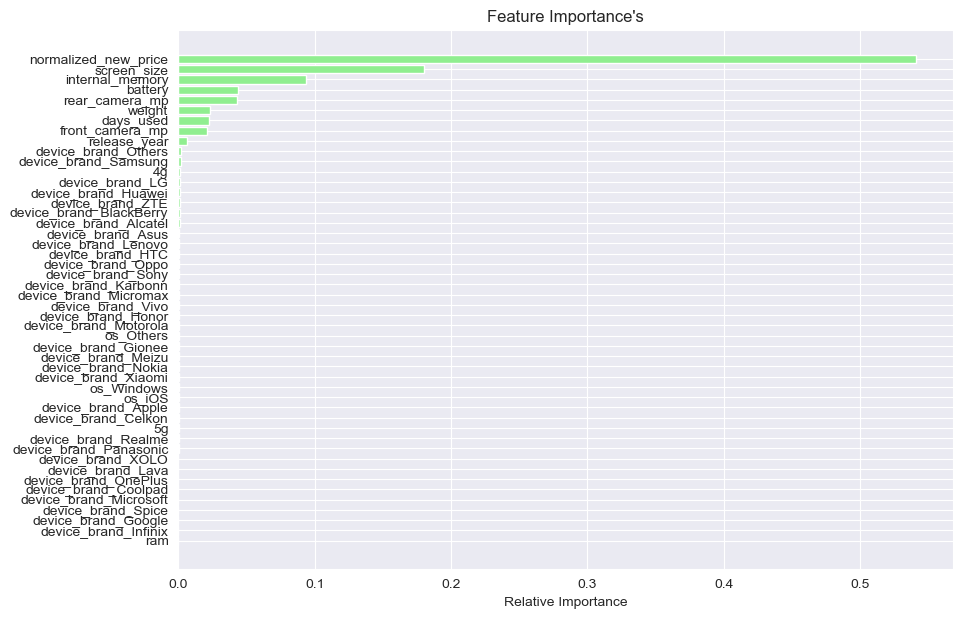

In [71]:
max_depth,min_samples_split,n_estimators = random_forest_best_params()
random_forest_model = RandomForestRegressor(n_estimators=150,min_samples_split=2,max_depth=None)
# fit the model
random_forest_model.fit(X_train, y_train.to_numpy().ravel())
feature_names = list(X_train.columns)
importances = random_forest_model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(10, 7))
plt.title("Feature Importance's")
plt.barh(range(len(indices)), importances[indices], color='lightgreen', align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

In [72]:
r2,rmse,mse,mae = model_evaluation(random_forest_model,y_train,y_val)
scores.append(("Random Forest regression all features",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 0.9776825859284074
R2 score test: 0.8535766960214032
R2 score validation: 0.8339868544086257
RMSE  train: 0.0843720618485259
RMSE  validation: 0.2219097868986329
MSE  train: 0.007118644820571479
MSE  validation: 0.049243953521396655
MAE  train: 0.06535917167600042
MAE  validation: 0.17989243822725745


Dimensionality reduction and k features selection

In [73]:
from sklearn.decomposition import PCA
def pca_x(x):
    # Create a PCA model with the desired number of components
    pca = PCA()
    # Fit the PCA model to the data
    pca.fit(x)
    # Transform the data into the new feature space
    x_pca = pca.transform(X)
    return x_pca

In [74]:
def elbow_pca(x):
    pca = PCA()
    pca.fit(x)
    explained_variance = pca.explained_variance_ratio_
    # Plot the explained variance graph against number of components
    plt.plot(range(1, len(explained_variance)+1), explained_variance, 'bo-', linewidth=2)
    plt.xticks(np.arange(1,50,1))
    plt.xlabel('Number of components')
    plt.ylabel('Explained variance')
    plt.title('Explained variance graph for PCA')
    plt.show()

The output of PCA (Principal Component Analysis) is a transformed set of features (Principal Components) that captures the most important information in the original set of features.
When we don't specify n_components, the PCA algorithm will calculate the number of components that can retain a certain proportion of the total variance in the dataset. This proportion is usually set to 0.95, meaning that 95% of the variance will be retained.

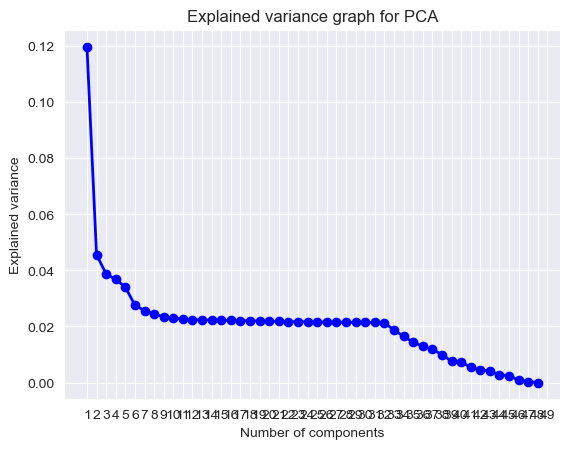

In [75]:
X,y = split_x_y()
X_new = pd.DataFrame(scale_standard(X),columns=X.columns)
elbow_pca(X_new)
X = pd.DataFrame(pca_x(X_new),columns=X.columns)
X_train, X_test_all, y_train, y_test_all = train_test_split(X, y, train_size=0.7, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_test_all, y_test_all, train_size=0.5, random_state=42)

In [76]:
linear_regression_model.fit(X_train,y_train)
r2,rmse,mse,mae = model_evaluation(linear_regression_model,y_train,y_val)
scores.append(("PCA Linear regression",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 0.8444314753250749
R2 score test: 0.8400428911152632
R2 score validation: 0.8328876170697606
RMSE  train: 0.22276019698299077
RMSE  validation: 0.22264325009155828
MSE  train: 0.049622105359900845
MSE  validation: 0.04957001681133217
MAE  train: 0.17594891229760426
MAE  validation: 0.182920234941257


In [77]:
ridge_model.fit(X_train,y_train)
r2,rmse,mse,mae = model_evaluation(ridge_model,y_train,y_val)
scores.append(("PCA Ridge regression",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 0.8440201487690144
R2 score test: 0.8412233333371384
R2 score validation: 0.8337206737014353
RMSE  train: 0.22305449397756066
RMSE  validation: 0.2220876175328763
MSE  train: 0.049753307283585645
MSE  validation: 0.049322909861429155
MAE  train: 0.1764937188675039
MAE  validation: 0.18242503992709422


In [78]:
lasso_model.fit(X_train,y_train)
r2,rmse,mse,mae = model_evaluation(lasso_model,y_train,y_val)
scores.append(("PCA Lasso regression",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 0.7036679215907488
R2 score test: 0.6930621417922691
R2 score validation: 0.7146392800525995
RMSE  train: 0.30744402715085906
RMSE  validation: 0.2909392487494667
MSE  train: 0.09452182983073815
MSE  validation: 0.08464564646290405
MAE  train: 0.232073530416237
MAE  validation: 0.23060811490918748


C:\Users\djord\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.156e+02, tolerance: 7.710e-02
  model = cd_fast.enet_coordinate_descent(


In [79]:
decision_model.fit(X_train,y_train.to_numpy().ravel())
r2,rmse,mse,mae = model_evaluation(decision_model,y_train,y_val)
scores.append(("PCA Decision Tree regression",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 1.0
R2 score test: 0.4462391708572152
R2 score validation: 0.3102322407239565
RMSE  train: 0.0
RMSE  validation: 0.4523313227694787
MSE  train: 0.0
MSE  validation: 0.20460362555838632
MAE  train: 0.0
MAE  validation: 0.3376383523352601


In [80]:
random_forest_model.fit(X_train,y_train.to_numpy().ravel())
r2,rmse,mse,mae = model_evaluation(random_forest_model,y_train,y_val)
scores.append(("PCA Random Forest regression",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 0.9502064270730597
R2 score test: 0.6950324332574134
R2 score validation: 0.6323887511032128
RMSE  train: 0.12602693427046952
RMSE  validation: 0.3302171411848315
MSE  train: 0.015882788161613245
MSE  validation: 0.10904336033228293
MAE  train: 0.09241438942388355
MAE  validation: 0.2533879076490049


Top k features

In [81]:
from sklearn.feature_selection import SelectKBest

k = 8
X,y = split_x_y()
top_k_features = SelectKBest(score_func=mutual_info_regression, k=k).fit(X, y.values.ravel())
X_k_best = top_k_features.transform(X)
X_train, X_test_all, y_train, y_test_all = train_test_split(X_k_best, y, train_size=0.7, random_state=42)
X_test, X_val, y_test, y_val_feature = train_test_split(X_test_all, y_test_all, train_size=0.5, random_state=42)

In [82]:
linear_regression_model.fit(X_train,y_train)
r2,rmse,mse,mae = model_evaluation(linear_regression_model,y_train,y_val)
scores.append(("Linear regression top 8 features",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 0.841135740699173
R2 score test: 0.8419311470552054
R2 score validation: 0.8345720227583564
RMSE  train: 0.22510742898427427
RMSE  validation: 0.22151834435858261
MSE  train: 0.050673354583910084
MSE  validation: 0.049070376887367595
MAE  train: 0.17757913926875513
MAE  validation: 0.18353872040812502


In [83]:
ridge_model.fit(X_train,y_train)
r2,rmse,mse,mae = model_evaluation(ridge_model,y_train,y_val)
scores.append(("Ridge regression top 8 features",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 0.8410943273725779
R2 score test: 0.8417592395643266
R2 score validation: 0.834586101342446
RMSE  train: 0.22513676799370005
RMSE  validation: 0.2215089181084223
MSE  train: 0.05068656430264913
MSE  validation: 0.049066200801563736
MAE  train: 0.17767077836770181
MAE  validation: 0.18353378275275992


In [84]:
lasso_model.fit(X_train,y_train)
r2,rmse,mse,mae = model_evaluation(lasso_model,y_train,y_val)
scores.append(("Lasso regression top 8 features",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 0.8411185622467022
R2 score test: 0.8419576327979588
R2 score validation: 0.8346398822425941
RMSE  train: 0.2251195994144103
RMSE  validation: 0.22147290566456806
MSE  train: 0.05067883404050456
MSE  validation: 0.04905024794350666
MAE  train: 0.17763985292119733
MAE  validation: 0.1835263939747351


In [85]:
random_forest_model.fit(X_train,y_train.to_numpy().ravel())
r2,rmse,mse,mae = model_evaluation(random_forest_model,y_train,y_val)
scores.append(("Random Forest regression top 8 features",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 0.9762976575653601
R2 score test: 0.8498969944858004
R2 score validation: 0.8298316766999807
RMSE  train: 0.08695055547611902
RMSE  validation: 0.2246697369993744
MSE  train: 0.007560399097605652
MSE  validation: 0.05047649072336806
MAE  train: 0.06669984955654398
MAE  validation: 0.18014704052482988


In [86]:
decision_model.fit(X_train,y_train.to_numpy().ravel())
r2,rmse,mse,mae = model_evaluation(decision_model,y_train,y_val)
scores.append(("Decision Tree regression top 8 features",round(r2,4),round(rmse,4),round(mse,4),round(mae,4)))

R2 score train: 0.9979712160663604
R2 score test: 0.7130168631193046
R2 score validation: 0.6782018671143111
RMSE  train: 0.02543868310002641
RMSE  validation: 0.30895624422459256
MSE  train: 0.0006471265978635693
MSE  validation: 0.09545396084536607
MAE  train: 0.003859199185767478
MAE  validation: 0.2388369498304431


Scores

In [87]:
columns=['models','R2','RMSE','MSE','MAE']
best_model= pd.DataFrame(scores, columns=columns)
best_model.head(15)

,models,R2,RMSE,MSE,MAE
0,Linear regression all features,0.8329,0.2226,0.0496,0.1829
1,Ridge regression all features,0.8329,0.2226,0.0496,0.1828
2,Lasso regression all features,0.8334,0.2223,0.0494,0.1829
3,Decision Tree regression all features,0.6864,0.3050,0.0930,0.2370
4,Random Forest regression all features,0.8340,0.2219,0.0492,0.1799
5,PCA Linear regression,0.8329,0.2226,0.0496,0.1829
6,PCA Ridge regression,0.8337,0.2221,0.0493,0.1824
7,PCA Lasso regression,0.7146,0.2909,0.0846,0.2306
8,PCA Decision Tree regression,0.3102,0.4523,0.2046,0.3376
9,PCA Random Forest regression,0.6324,0.3302,0.1090,0.2534


Diagnostic analyst

Lasso,Ridge and Linear  regression and Random forest gave us  similar results both for top 8 feature selection.

In [88]:
final_evaluation(ridge_model,X_test,y_test)

R2 score test: 0.8417592395643266
RMSE test: 0.22742885915205846
MSE test: 0.05172388597520684
MAE test: 0.177698159313078


In [89]:
final_evaluation(linear_regression_model,X_test,y_test)

R2 score test: 0.8419311470552054
RMSE test: 0.2273052900143123
MSE test: 0.05166769486849063
MAE test: 0.17761323898987935


In [90]:
final_evaluation(lasso_model,X_test,y_test)

R2 score test: 0.8419576327979588
RMSE test: 0.2272862457765115
MSE test: 0.051659037519180794
MAE test: 0.17763489510337818


We now compare the actual output values for X_test with the predicted values

In [91]:
data = y_test.copy()
data["prediction"] = lasso_model.predict(X_test)
data["residual"] = data["normalized_used_price"] - data["prediction"]
data.head()

,normalized_used_price,prediction,residual
1360,4.011868,3.774956,0.236913
2686,4.553982,4.845671,-0.291689
3227,4.201404,4.195533,0.005871
1963,4.711240,4.845984,-0.134744
490,4.332442,4.271224,0.061218


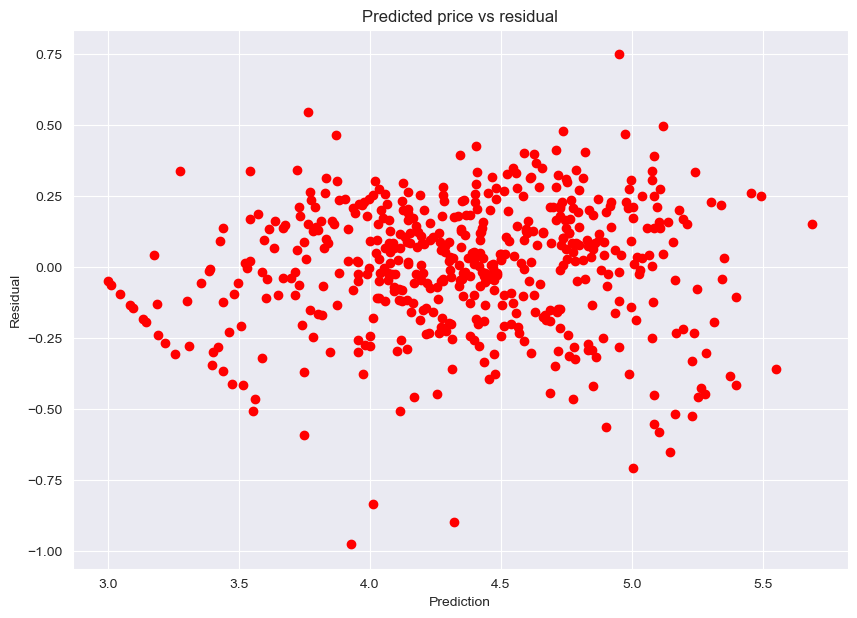

In [92]:
plt.figure(figsize=(10,7))
plt.scatter(data["prediction"],data["residual"],color="red")
plt.title("Predicted price vs residual")
plt.xlabel("Prediction")
plt.ylabel("Residual")
plt.show()

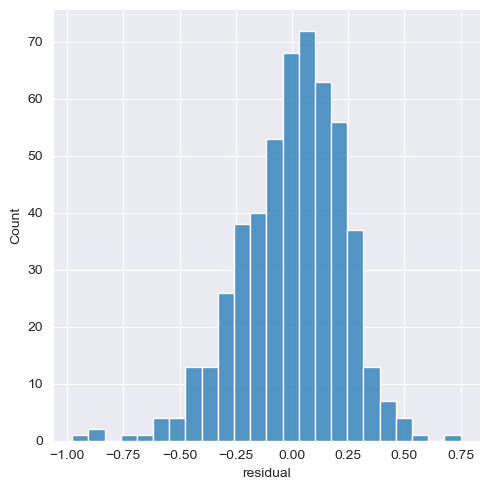

In [93]:
sns.displot(data.residual)

Random forest test

In [94]:
X,y = split_x_y()
X_new = scale_standard(X)
X = pd.DataFrame(X_new, columns=X.columns)
X_train, X_test_all, y_train, y_test_all = train_test_split(X,y,train_size=0.7,random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_test_all,y_test_all,train_size=0.5,random_state=42)

In [95]:
random_forest_model.fit(X_train,y_train)
final_evaluation(random_forest_model,X_test,y_test)

C:\Users\djord\AppData\Local\Temp\ipykernel_4224\3706394217.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  random_forest_model.fit(X_train,y_train)


R2 score test: 0.8532948877562488
RMSE test: 0.2189823016473036
MSE test: 0.04795324843475066
MAE test: 0.17061057793374507


In [96]:
data = y_test.copy()
data["prediction"] = random_forest_model.predict(X_test)
data["residual"] = data["normalized_used_price"] - data["prediction"]
data.head()

,normalized_used_price,prediction,residual
1360,4.011868,3.751475,0.260394
2686,4.553982,4.774424,-0.220442
3227,4.201404,4.200064,0.001339
1963,4.711240,4.861353,-0.150113
490,4.332442,4.389470,-0.057027


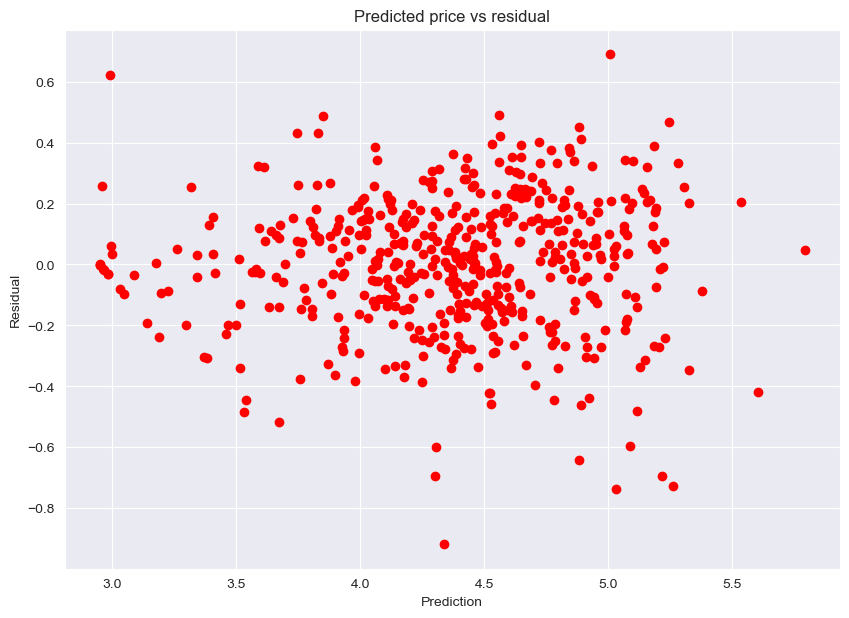

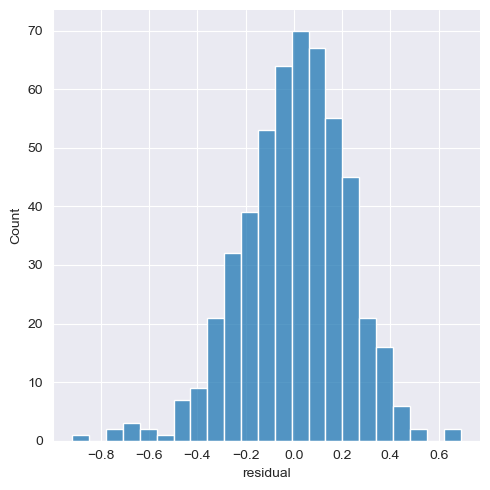

In [97]:
plt.figure(figsize=(10, 7))
plt.scatter(data["prediction"], data["residual"], color="red")
plt.title("Predicted price vs residual")
plt.xlabel("Prediction")
plt.ylabel("Residual")
plt.show()
sns.displot(data.residual)